In [1]:
# Imports

import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt
import seaborn as sns


# own functions
import preprocessing_functions as ppf
import decoder_functions as dff


mne.set_log_level('WARNING') # to not have many 'debug' or warning 'messages'



In [ ]:
data_path_all_patients = '/your/data/path'

# load epochs all ps
epochs_s1 = mne.read_epochs(data_path_all_patients + 'Subject001/' + 'raw_epochs_stim_s001.fif')
epochs_s2 = mne.read_epochs(data_path_all_patients + 'Subject002/' + 'raw_epochs_stim_s002.fif')
epochs_s3 = mne.read_epochs(data_path_all_patients + 'Subject003/' + 'raw_epochs_stim_s003.fif')
epochs_s4 = mne.read_epochs(data_path_all_patients + 'Subject004/' + 'raw_epochs_stim_s004.fif')

# load df all ps behaviour
events_s1 = pd.read_pickle(data_path_all_patients + 'Subject001/' + 'behaviour_s001.pickle').reset_index(drop=True)
events_s2 = pd.read_pickle(data_path_all_patients + 'Subject002/' + 'behaviour_s002.pickle').reset_index(drop=True)
events_s3 = pd.read_pickle(data_path_all_patients + 'Subject003/' + 'behaviour_s003.pickle').reset_index(drop=True)
events_s4 = pd.read_pickle(data_path_all_patients + 'Subject004/' + 'behaviour_s004.pickle').reset_index(drop=True)

# load probes df
probes_path_all_patients = '/your/probes_data/path'

probes_s1 = pd.read_csv(probes_path_all_patients + 'S1_MMM.tsv', sep='\t')
probes_s2 = pd.read_csv(probes_path_all_patients + 'S2_RGE.tsv', sep='\t')
probes_s3 = pd.read_csv(probes_path_all_patients + 'S3_RCM.tsv', sep='\t')
probes_s4 = pd.read_csv(probes_path_all_patients + 'S4_BBB.tsv', sep='\t')

In [3]:
# Since I will put all patients in the same pool, I remove the Right hemisphere channels from subject 1 and 2
ch_names_s1 = epochs_s1.info['ch_names']
ch_names_s2 = epochs_s2.info['ch_names']
# Filter out entries that contain the ' symbol
filtered_channels_s1 = [entry for entry in ch_names_s1 if "'" in entry]
filtered_channels_s2 = [entry for entry in ch_names_s2 if "'" in entry]
# Keep filtered channels
epochs_s1 = epochs_s1.pick_channels(filtered_channels_s1)
epochs_s2 = epochs_s2.pick_channels(filtered_channels_s2)

In [4]:
# REDUCE LENGTHS OF EPOCHS, FROM -0.500ms to 2 SECONDS
new_tmin = -0.5 # seconds (BEFORE -0.5)
new_tmax = 2.0 # seconds
epochs_s1.crop(tmin=new_tmin, tmax=new_tmax)
epochs_s2.crop(tmin=new_tmin, tmax=new_tmax)
epochs_s3.crop(tmin=new_tmin, tmax=new_tmax)
epochs_s4.crop(tmin=new_tmin, tmax=new_tmax)


Number of events,343
Events,1: 343
Time range,-0.500 – 2.000 s
Baseline,off


In [5]:
# Init variables that will be needed troughout the notebook:

# dictionaries with brain regions - channels
list_channels_s1 = epochs_s1.info['ch_names']
list_channels_s2 = epochs_s2.info['ch_names']
list_channels_s3 = epochs_s3.info['ch_names']
list_channels_s4 = epochs_s4.info['ch_names']

dict_brain_regions_s1 = ppf.group_channels_brain_regions(probes_s1, list_channels_s1)
dict_brain_regions_s2 = ppf.group_channels_brain_regions(probes_s2, list_channels_s2)
dict_brain_regions_s3 = ppf.group_channels_brain_regions(probes_s3, list_channels_s3)
dict_brain_regions_s4 = ppf.group_channels_brain_regions(probes_s4, list_channels_s4)

# get indices of each trial type (SC, SI, UC, UI)
idx_trial_type_s1 = ppf.get_index_trial_type(events_s1)
idx_trial_type_s2 = ppf.get_index_trial_type(events_s2)
idx_trial_type_s3 = ppf.get_index_trial_type(events_s3)
idx_trial_type_s4 = ppf.get_index_trial_type(events_s4)

## Plot descriptive info about channel locations, number of trials...

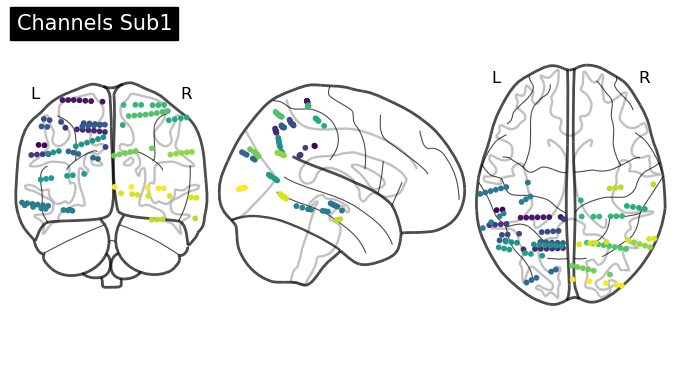

Num of channels subj 1: 115


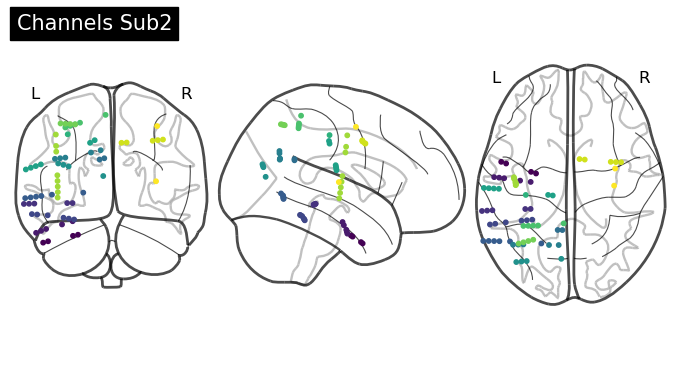

Num of channels subj 2: 68


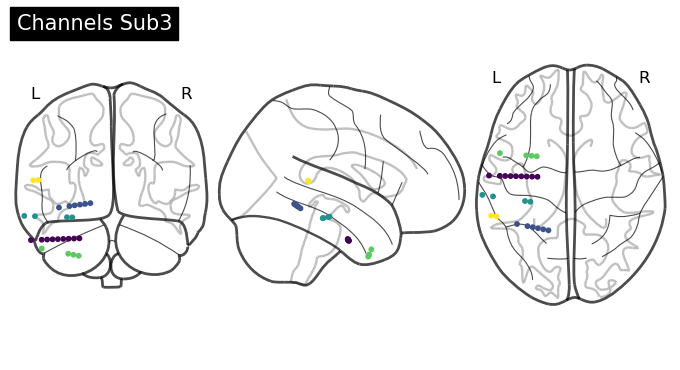

Num of channels subj 3: 25


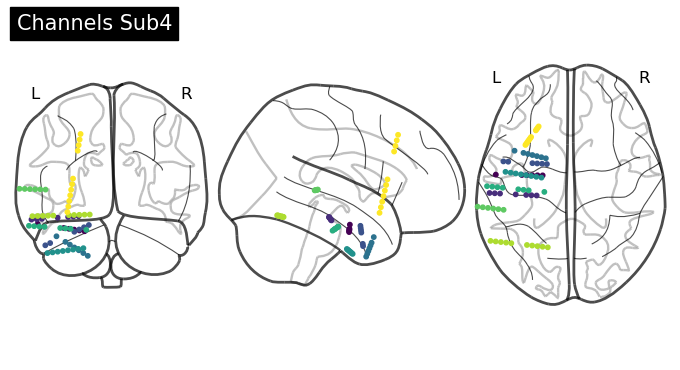

Num of channels subj 4: 69


In [8]:
# Visualize channels all subjs

# list_of_list_brain_regions_s1 = [value for value in dict_brain_regions_s1.values()]
# list_of_list_brain_regions_s2 = [value for value in dict_brain_regions_s2.values()]
# list_of_list_brain_regions_s3 = [value for value in dict_brain_regions_s3.values()]
# list_of_list_brain_regions_s4 = [value for value in dict_brain_regions_s4.values()]

list_of_list_probes_s1 = ppf.create_probe_channels_list_of_lists(list_channels_s1)
list_of_list_probes_s2 = ppf.create_probe_channels_list_of_lists(list_channels_s2)
list_of_list_probes_s3 = ppf.create_probe_channels_list_of_lists(list_channels_s3)
list_of_list_probes_s4 = ppf.create_probe_channels_list_of_lists(list_channels_s4)


# print(list_of_list_brain_regions)
ppf.plot_channel_locations(probes_s1, list_of_list_probes_s1, 'Channels Sub1')
print(f'Num of channels subj 1: {len(list_channels_s1)}')
ppf.plot_channel_locations(probes_s2, list_of_list_probes_s2, 'Channels Sub2')
print(f'Num of channels subj 2: {len(list_channels_s2)}')
ppf.plot_channel_locations(probes_s3, list_of_list_probes_s3, 'Channels Sub3')
print(f'Num of channels subj 3: {len(list_channels_s3)}')
ppf.plot_channel_locations(probes_s4, list_of_list_probes_s4, 'Channels Sub4')
print(f'Num of channels subj 4: {len(list_channels_s4)}')

# ppf.plot_channel_locations(probes_s4, list_of_list_brain_regions, 'channels s4')

In [9]:
# # Since I will put all patients in the same pool, I remove the Right hemisphere channels from subject 1 and 2
ch_names_s1 = epochs_s1.info['ch_names']
ch_names_s2 = epochs_s2.info['ch_names']
# Filter out entries that contain the ' symbol
filtered_channels_s1 = [entry for entry in ch_names_s1 if "'" in entry]
filtered_channels_s2 = [entry for entry in ch_names_s2 if "'" in entry]
# Keep filtered channels
epochs_s1 = epochs_s1.pick_channels(filtered_channels_s1)
epochs_s2 = epochs_s2.pick_channels(filtered_channels_s2)

In [10]:
# Get new list of channels after removing RH channels
list_channels_s1 = epochs_s1.info['ch_names']
list_channels_s2 = epochs_s2.info['ch_names']
# list_channels_s3 = epochs_s3.info['ch_names']
# list_channels_s4 = epochs_s4.info['ch_names']

dict_brain_regions_s1 = ppf.group_channels_brain_regions(probes_s1, list_channels_s1)
dict_brain_regions_s2 = ppf.group_channels_brain_regions(probes_s2, list_channels_s2)
dict_brain_regions_s3 = ppf.group_channels_brain_regions(probes_s3, list_channels_s3)
dict_brain_regions_s4 = ppf.group_channels_brain_regions(probes_s4, list_channels_s4)


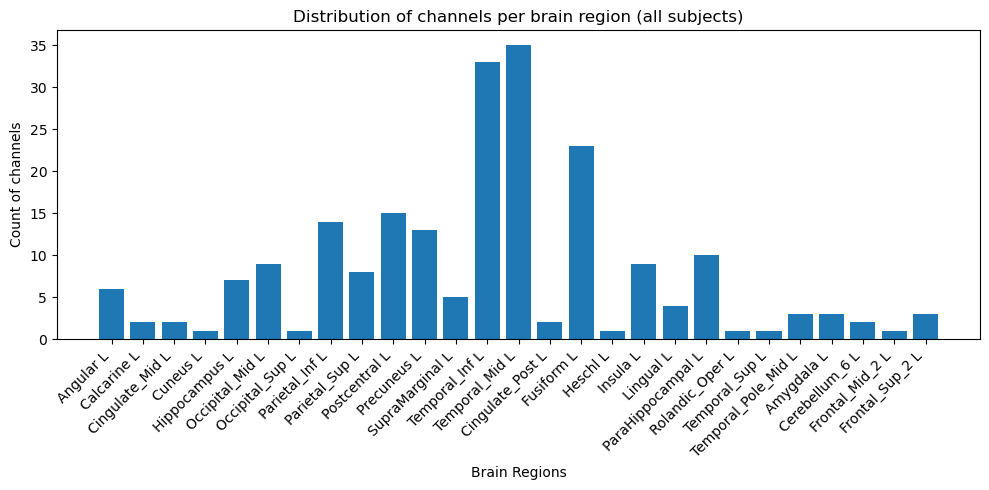

In [7]:
# Same plot as above with the only difference that now I add all channels that belong to that region (per subject)
region_counts = {}

for dictionary in [dict_brain_regions_s1, dict_brain_regions_s2, dict_brain_regions_s3, dict_brain_regions_s4]:
# for dictionary in [dict_brain_regions_s2]:
    for region in dictionary:
        # print(dictionary[region])
        region_counts[region] = region_counts.get(region, 0) + len(dictionary[region])

# Extract brain regions and counts
regions = list(region_counts.keys())
counts = list(region_counts.values())

# Create bar plot
plt.figure(figsize=(10,5))
plt.bar(regions, counts)
plt.xlabel('Brain Regions')
plt.ylabel('Count of channels')
plt.title('Distribution of channels per brain region (all subjects)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# ANOTHER PLOT WHERE EACH AREA HAS FOUR BARS (ONE PER PS), THAT CONTAIN EACH THE NUM OF CHANNELS THAT BELONG TO THAT AREA

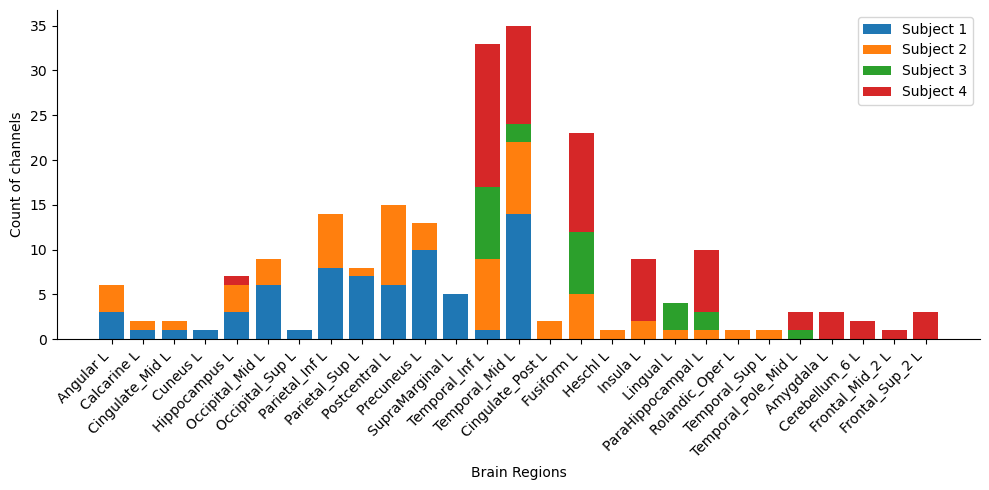

In [18]:
# PLOT CHANNEL COUNT PER BRAIN REGION (AND SUBJECT)

# Initialize a dictionary to store counts per brain region per subject
subject_region_counts = {}

# Iterate over each subject's dictionary of brain regions
for subject_index, subject_dict in enumerate([dict_brain_regions_s1, dict_brain_regions_s2, dict_brain_regions_s3, dict_brain_regions_s4]):

    # Iterate over each brain region in the subject's dictionary
    for region, channels in subject_dict.items():
        # If the region is not yet in the subject_region_counts dictionary, add it
        if region not in subject_region_counts:
            subject_region_counts[region] = [0, 0, 0, 0]  # Initialize counts for each subject to 0
        # Count the number of channels for the current subject and add it to the corresponding list
        subject_region_counts[region][subject_index] += len(channels)

# Extract brain regions and counts
regions = list(subject_region_counts.keys())
counts_per_subject = np.array(list(subject_region_counts.values()))

# Create a stacked bar plot
num_subjects = counts_per_subject.shape[1]
bar_width = 0.8  # Width of each bar

# plt.figure(figsize=(12, 6))
plt.figure(figsize=(10, 5))


bottom = np.zeros(len(regions))
for i in range(num_subjects):
    plt.bar(regions, counts_per_subject[:, i], bottom=bottom, label=f'Subject {i+1}')
    bottom += counts_per_subject[:, i]

plt.xlabel('Brain Regions')
plt.ylabel('Count of channels')
plt.title('Channel count per brain region (p er subject)')
plt.xticks(rotation=45, ha='right')
plt.legend()
sns.despine()
plt.tight_layout()
plt.show()


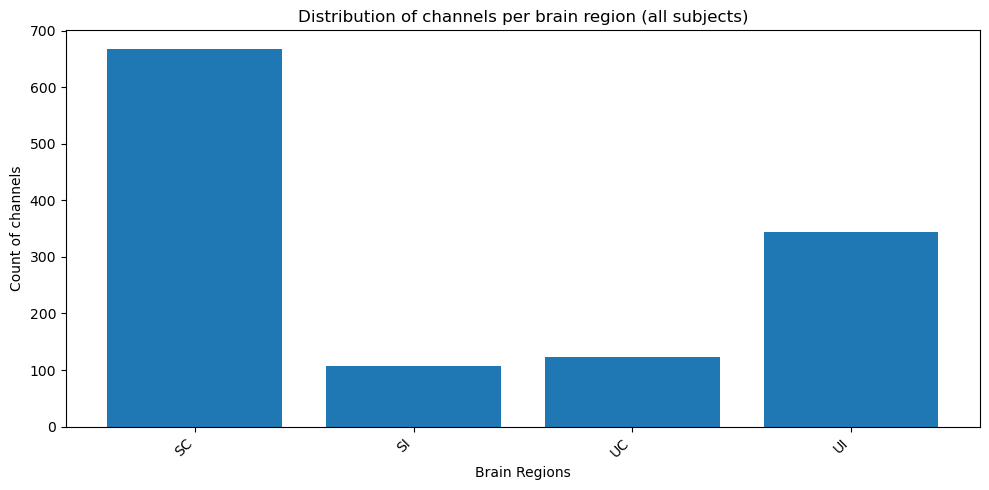

In [4]:
# Plot number of trials (SC, SI, UC, UI) per subject

# get index of trial type (to count the number of trials)

# Same plot as above with the only difference that now I add all channels that belong to that region (per subject)
trial_counts = {}

for dictionary in [idx_trial_type_s1, idx_trial_type_s2, idx_trial_type_s3, idx_trial_type_s4]:
# for dictionary in [idx_trial_type_s2]:
    for tt in dictionary:
        # print(dictionary[region])
        trial_counts[tt] = trial_counts.get(tt, 0) + len(dictionary[tt])

# Extract brain regions and counts
trial_types = list(trial_counts.keys())
counts = list(trial_counts.values())

# Create bar plot
plt.figure(figsize=(10,5))
plt.bar(trial_types, counts)
plt.xlabel('Brain Regions')
plt.ylabel('Count of channels')
plt.title('Distribution of channels per brain region (all subjects)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()



dict_keys(['SC', 'SI', 'UC', 'UI']) dict_keys(['SC', 'SI', 'UC', 'UI']) dict_keys(['SC', 'SI', 'UC', 'UI']) dict_keys(['SC', 'SI', 'UC', 'UI'])


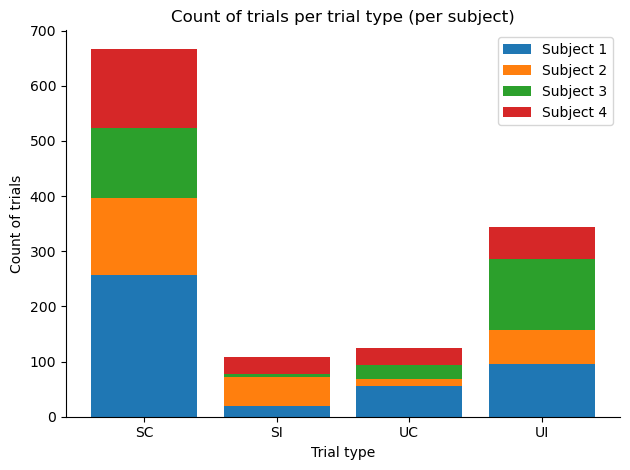

Total number of trials subj 1 539 (SC=256, SI=19, UC=55, UI=95)
Total number of trials subj 2 350 (SC=140, SI=53, UC=13, UI=63)
Total number of trials subj 3 361 (SC=128, SI=6, UC=25, UI=127)
Total number of trials subj 4 343 (SC=143, SI=30, UC=31, UI=59)


In [33]:
# PLOT TRIAL COUNT PER TRIAL TYPE (AND SUBJECT)

subject_region_counts = {}

print(idx_trial_type_s1.keys(), idx_trial_type_s2.keys(), idx_trial_type_s3.keys(), idx_trial_type_s4.keys())
# Iterate over each subject's dictionary of brain regions
for subject_index, subject_dict in enumerate([idx_trial_type_s1, idx_trial_type_s2, idx_trial_type_s3, idx_trial_type_s4]):
    # Get the subject index
    # subject_index = [idx_trial_type_s1, idx_trial_type_s2, idx_trial_type_s3, idx_trial_type_s4].index(subject_dict)
    # Iterate over each brain region in the subject's dictionary
    for region, channels in subject_dict.items():
        # If the region is not yet in the subject_region_counts dictionary, add it
        if region not in subject_region_counts:
            subject_region_counts[region] = [0, 0, 0, 0]  # Initialize counts for each subject to 0
        # Count the number of channels for the current subject and add it to the corresponding list
        subject_region_counts[region][subject_index] += len(channels)

# Extract brain regions and counts
regions = list(subject_region_counts.keys())
counts_per_subject = np.array(list(subject_region_counts.values()))

# Create a stacked bar plot
num_subjects = counts_per_subject.shape[1]
bar_width = 0.8  # Width of each bar

plt.figure()

bottom = np.zeros(len(regions))
for i in range(num_subjects):
    plt.bar(regions, counts_per_subject[:, i], bottom=bottom, label=f'Subject {i+1}')
    bottom += counts_per_subject[:, i]

plt.xlabel('Trial type')
plt.ylabel('Count of trials')
plt.title('Count of trials per trial type (per subject)')
plt.legend()
plt.tight_layout()
sns.despine()
plt.show()

# print TOTAL num of trials per subject

print('Total number of trials subj 1', len(epochs_s1), f"(SC={len(idx_trial_type_s1['SC'])}, SI={len(idx_trial_type_s1['SI'])}, UC={len(idx_trial_type_s1['UC'])}, UI={len(idx_trial_type_s1['UI'])})")
print('Total number of trials subj 2', len(epochs_s2), f"(SC={len(idx_trial_type_s2['SC'])}, SI={len(idx_trial_type_s2['SI'])}, UC={len(idx_trial_type_s2['UC'])}, UI={len(idx_trial_type_s2['UI'])})")
print('Total number of trials subj 3', len(epochs_s3), f"(SC={len(idx_trial_type_s3['SC'])}, SI={len(idx_trial_type_s3['SI'])}, UC={len(idx_trial_type_s3['UC'])}, UI={len(idx_trial_type_s3['UI'])})")
print('Total number of trials subj 4', len(epochs_s4), f"(SC={len(idx_trial_type_s4['SC'])}, SI={len(idx_trial_type_s4['SI'])}, UC={len(idx_trial_type_s4['UC'])}, UI={len(idx_trial_type_s4['UI'])})")

## Decode target location

Decode target location (in individual subjects) in each brain region (so pool of electrodes falling into that brain region)
The aim is to show a nxm plot with as many subplots as areas per subject. In each subplot there is the decoding performance throught time (stimulus centered), for all trial types.

In [6]:
# Downsample the data (from 0-30Hz) -- decoding from the ANALOG signal
epochs_s1_ds = epochs_s1.copy().resample(sfreq=60)
epochs_s3_ds = epochs_s3.copy().resample(sfreq=60)
epochs_s4_ds = epochs_s4.copy().resample(sfreq=60)

# epochs_s1_ds.info

#### Decode target location using each channel as a feature

In [17]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 1
dict_results_s1 = dff.decode_target_location_brain_area(epochs_s1_ds,events_s1,dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, target='Location')

Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


In [33]:
# dict_results_s1_quadrant = decode_target_location_brain_area(epochs_s1,events_s1,dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], 1, target='Quadrant')

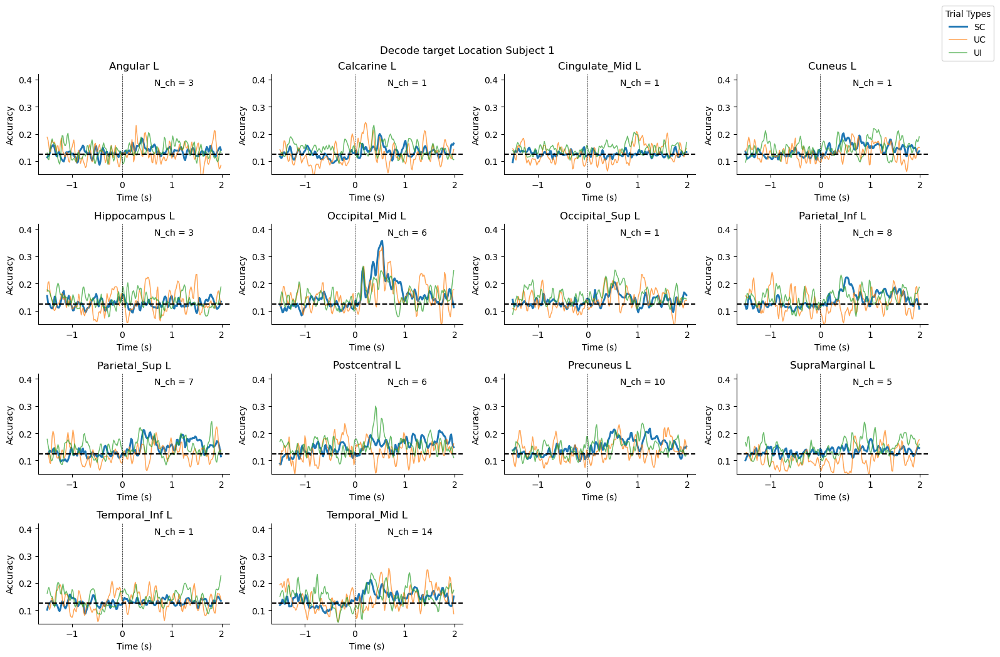

In [19]:
# Plot results S1
dff.plot_decoding_all_areas(dict_results_s1, dict_brain_regions_s1, epochs_s1_ds.times, ['SC', 'UC', 'UI'],1, target='Location')

In [19]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 2
# dict_results_s2 = decode_target_location_brain_area(epochs_s2,events_s2,dict_brain_regions_s2, idx_trial_type_s2, ['SC', 'UI'], tw=1)

In [20]:
# dict_results_s2_quadrant = decode_target_location_brain_area(epochs_s2,events_s2,dict_brain_regions_s2, idx_trial_type_s2, ['SC', 'UI'], 1, target='Quadrant')

In [21]:
# Plot results S2
# plot_decoding_all_areas(dict_results_s2, dict_brain_regions_s2, epochs_s2.times, ['SC', 'UI'], 2, tw=1, target='Location')
# plot_decoding_all_areas(dict_results_s2_quadrant, dict_brain_regions_s2, epochs_s2.times, ['SC', 'UI'], 2, tw=1, target='Quadrant')


In [35]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 3
dict_results_s3 = dff.decode_target_location_brain_area(epochs_s3_ds,events_s3,dict_brain_regions_s3, idx_trial_type_s3, ['SC', 'UI'],tw=1)

Fusiform L
Lingual L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


In [36]:
dict_results_s3_quadrant = dff.decode_target_location_brain_area(epochs_s3,events_s3,dict_brain_regions_s3, idx_trial_type_s3, ['SC', 'UI'], tw=1, target='Quadrant')

Fusiform L
Lingual L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


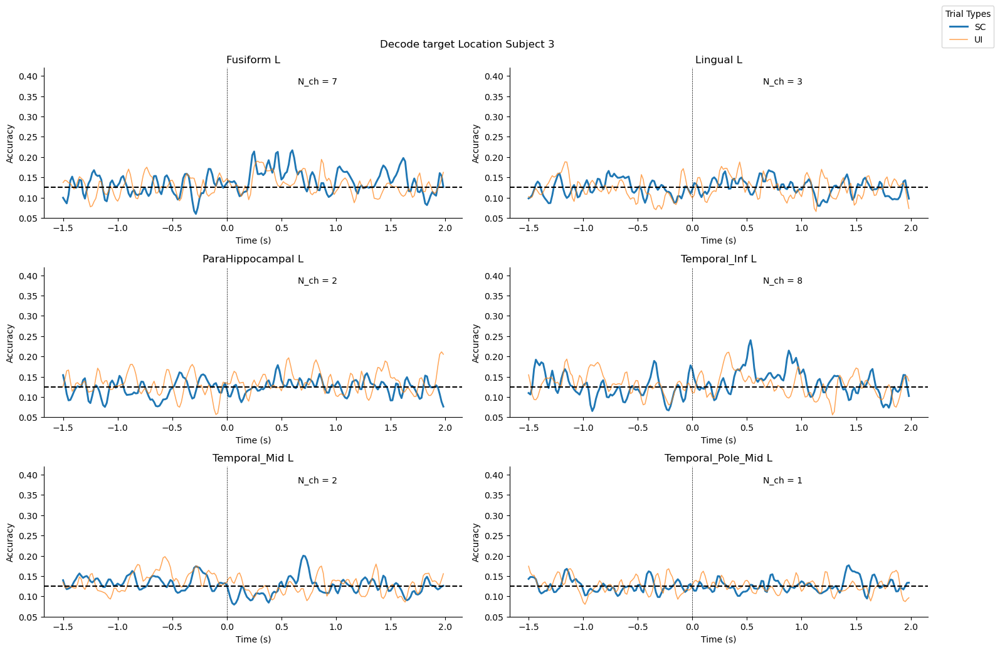

In [37]:
# Plot results S3
dff.plot_decoding_all_areas(dict_results_s3, dict_brain_regions_s3, epochs_s3_ds.times, ['SC', 'UI'], 3, tw=1, target='Location')

In [24]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 4
dict_results_s4 = dff.decode_target_location_brain_area(epochs_s4_ds,events_s4,dict_brain_regions_s4, idx_trial_type_s4, ['SC'], tw=1, target='Location') # in UI trials there are not all classes (CV =3 means that at least you need one class in each fold. I have 8 classes, since I have so few trials, it is possible that there are classes that are not represented

Amygdala L
Cerebellum_6 L
Frontal_Mid_2 L
Frontal_Sup_2 L
Fusiform L
Hippocampus L
Insula L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


In [40]:
dict_results_s4_quadrant = dff.decode_target_location_brain_area(epochs_s4_ds,events_s4,dict_brain_regions_s4, idx_trial_type_s4, ['SC', 'UC'], tw=1, target='Quadrant') # in UI trials there are not all classes (CV =3 means that at least you need one class in each fold. I have 8 classes, since I have so few trials, it is possible that there are classes that are not represented

Amygdala L
Cerebellum_6 L
Frontal_Mid_2 L
Frontal_Sup_2 L
Fusiform L
Hippocampus L
Insula L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


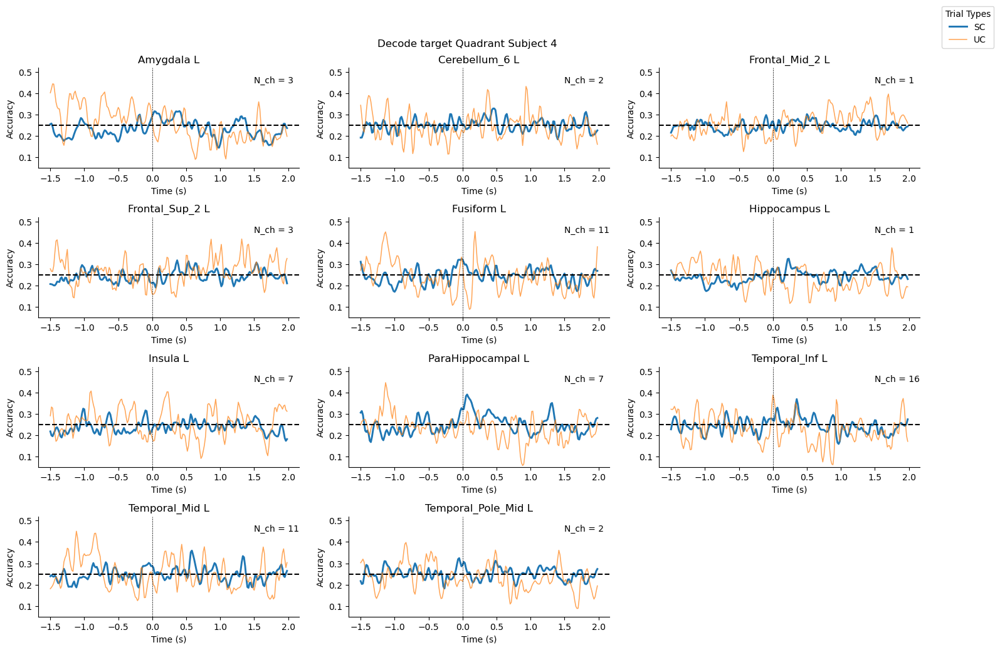

In [41]:
# Plot results S4
# plot_decoding_all_areas(dict_results_s4, dict_brain_regions_s4, epochs_s4_ds.times, ['SC'], 4, 'Location') # in UI trials there are not all classes (for target = 'Location')
dff.plot_decoding_all_areas(dict_results_s4_quadrant, dict_brain_regions_s4, epochs_s4_ds.times, ['SC', 'UC'], 4, 'Quadrant') # in UI trials there are not all classes (for target = 'Location')


#### Permutation based test

Here I am using the statistics used in Figure 2 in this paper: https://academic.oup.com/nc/article/2022/1/niac005/6535734.


In [11]:
observed_scores, permuted_scores = dff.get_observed_and_permutation_scores(epochs_s1_ds, events_s1, dict_brain_regions_s1['Occipital_Mid L'], 1, idx_trial_type_s1['SC'], n_permutations=30)
# significant_clusters, observed_t_values, observed_p_values = cluster_based_permutation_test(observed_scores, permuted_scores)


In [12]:
significant_clusters = dff.cluster_based_permutation_test(observed_scores, permuted_scores)

In [14]:
# dict_results_permuted = run_temporal_decoder_all_areas_permutation(epochs_s1_ds, events_s1, dict_brain_regions_s1, idx_trial_type_s1, trial_types=['SC', 'UC', 'UI'], tw=1, n_permutations=20)
dict_results_permuted_s1 = dff.run_temporal_decoder_all_areas_permutation(epochs_s1_ds, events_s1, dict_brain_regions_s1, idx_trial_type_s1, trial_types=['SC', 'UC', 'UI'], tw=1, n_permutations=20)

Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


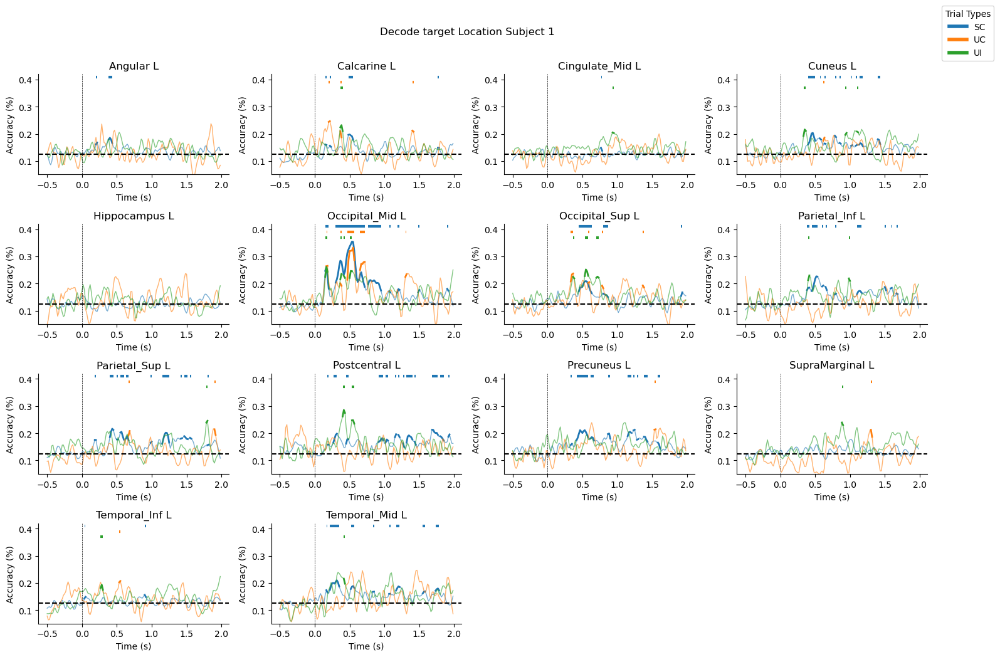

In [15]:
# Plot results S1
dff.plot_decoding_all_areas_w_stats(dict_results_permuted_s1, dict_brain_regions_s1, epochs_s1_ds.times, labels = ['SC', 'UC', 'UI'], subj_num= 1)

In [237]:
# Subject 3
dict_results_permuted_s3 = dff.run_temporal_decoder_all_areas_permutation(epochs_s3_ds, events_s3, dict_brain_regions_s3, idx_trial_type_s3, trial_types=['SC', 'UI'], tw=1, n_permutations=20)


Fusiform L
Lingual L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


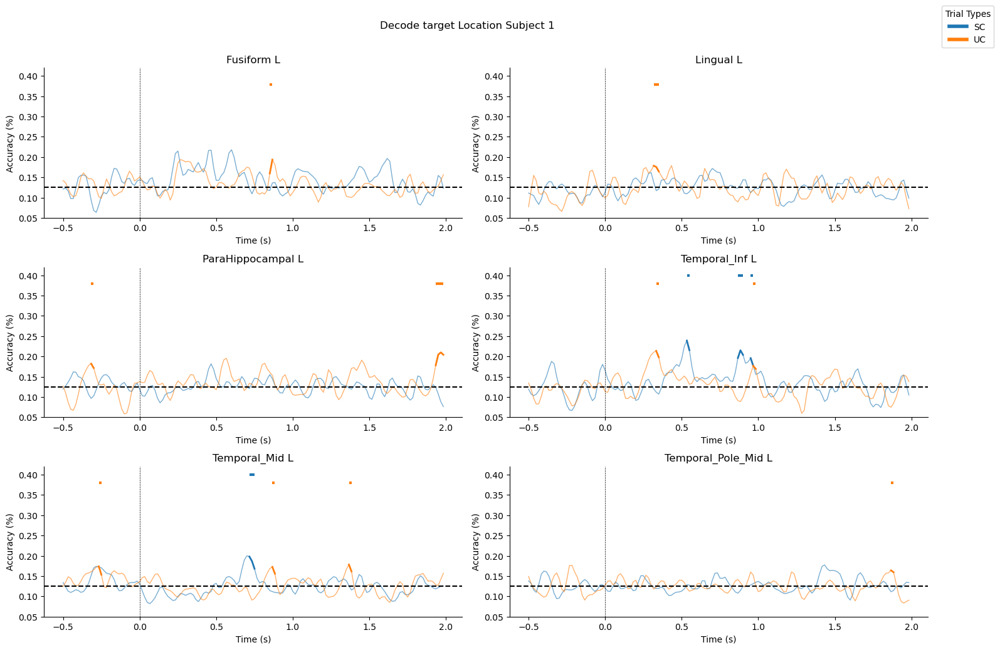

In [239]:
# Plot resutls S3
dff.plot_decoding_all_areas_w_stats(dict_results_permuted_s3, dict_brain_regions_s3, epochs_s3_ds.times, labels = ['SC', 'UC', 'UI'], subj_num= 1)

In [241]:
# Subject 4
dict_results_permuted_s4 = dff.run_temporal_decoder_all_areas_permutation(epochs_s4_ds, events_s4, dict_brain_regions_s4, idx_trial_type_s4, trial_types=['SC'], tw=1, n_permutations=20)

Amygdala L
Cerebellum_6 L
Frontal_Mid_2 L
Frontal_Sup_2 L
Fusiform L
Hippocampus L
Insula L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


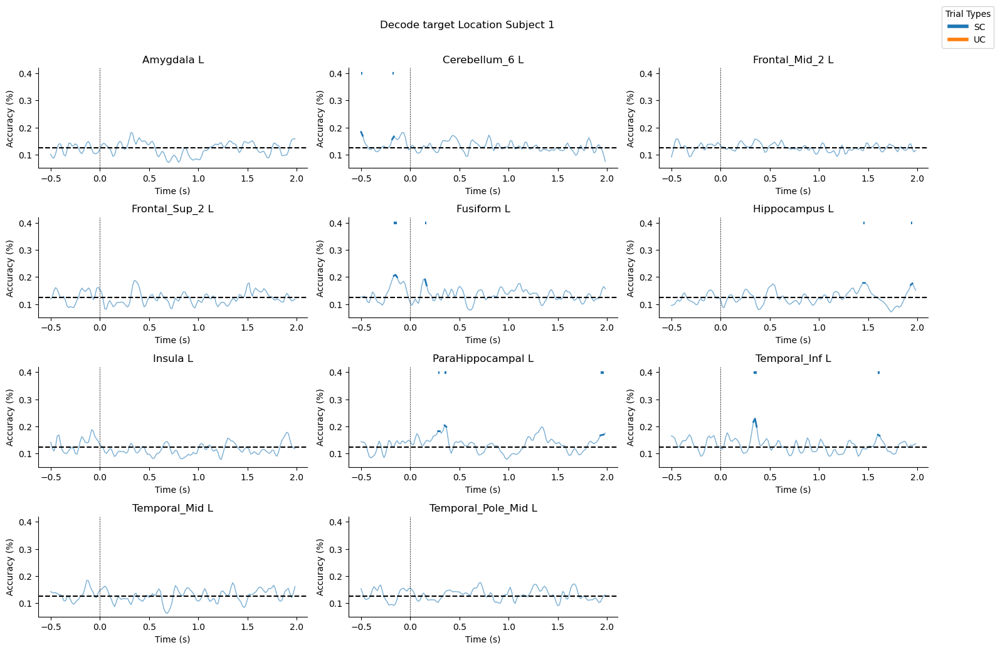

In [243]:
# Plot resutls S4
dff.plot_decoding_all_areas_w_stats(dict_results_permuted_s4, dict_brain_regions_s4, epochs_s4_ds.times, labels = ['SC', 'UC', 'UI'], subj_num= 1)

#### Decode target location with averaged channels

In [271]:
# DECODE TARGET LOCATION WITH AVERAGED CHANNELS 

In [161]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 1 with averaged channels
dict_results_s1_avg_ch = dff.decode_target_location_brain_area(epochs_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'],1, target='Location', average_channels=True)

Angular L
(256, 1751)
(55, 1751)
(95, 1751)
Calcarine L
(256, 1751)
(55, 1751)
(95, 1751)
Cingulate_Mid L
(256, 1751)
(55, 1751)
(95, 1751)
Cuneus L
(256, 1751)
(55, 1751)
(95, 1751)
Hippocampus L
(256, 1751)
(55, 1751)
(95, 1751)
Occipital_Mid L
(256, 1751)
(55, 1751)
(95, 1751)
Occipital_Sup L
(256, 1751)
(55, 1751)
(95, 1751)
Parietal_Inf L
(256, 1751)
(55, 1751)
(95, 1751)
Parietal_Sup L
(256, 1751)
(55, 1751)
(95, 1751)
Postcentral L
(256, 1751)
(55, 1751)
(95, 1751)
Precuneus L
(256, 1751)
(55, 1751)
(95, 1751)
SupraMarginal L
(256, 1751)
(55, 1751)
(95, 1751)
Temporal_Inf L
(256, 1751)
(55, 1751)
(95, 1751)
Temporal_Mid L
(256, 1751)
(55, 1751)
(95, 1751)


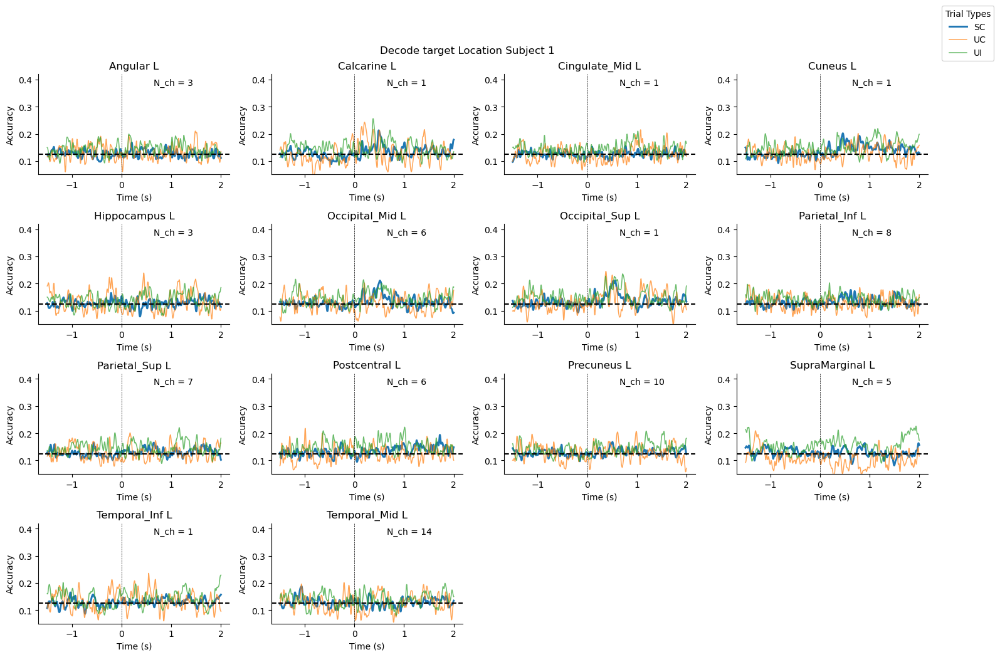

In [163]:
# Plot results S1 (averaged channels)
dff.plot_decoding_all_areas(dict_results_s1_avg_ch, dict_brain_regions_s1, epochs_s1.times, ['SC', 'UC', 'UI'],1, target='Location')

In [164]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 3 with averaged channels
dict_results_s3_avg_ch = dff.decode_target_location_brain_area(epochs_s3, events_s3, dict_brain_regions_s3, idx_trial_type_s3, ['SC','UI'],1, target='Location', average_channels=True)

Fusiform L
Lingual L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


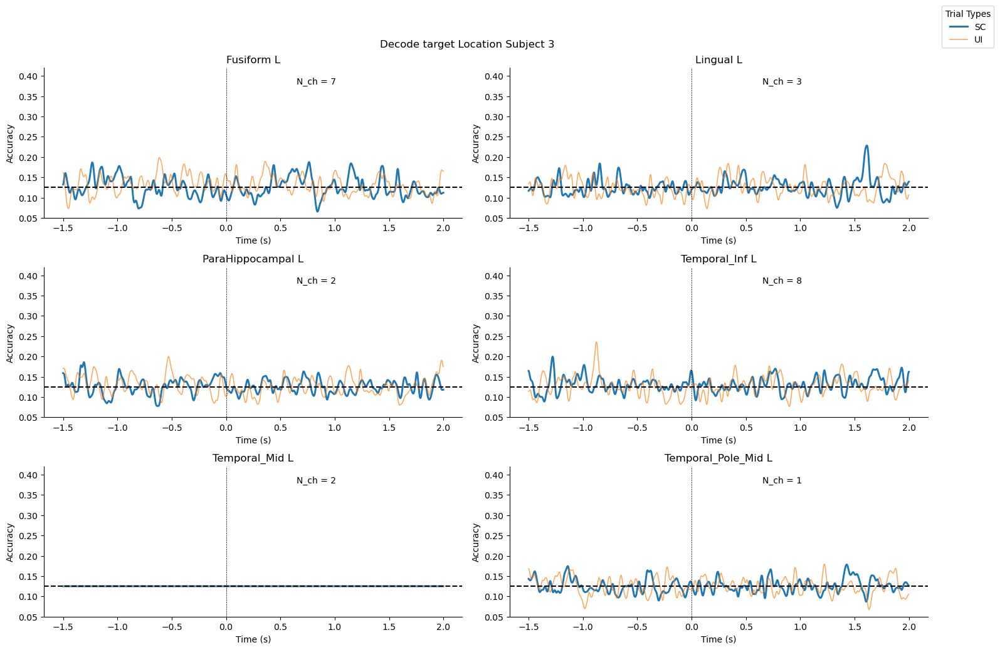

In [165]:
# Plot results S3 (averaged channels)
dff.plot_decoding_all_areas(dict_results_s3_avg_ch, dict_brain_regions_s3, epochs_s3.times, ['SC', 'UI'],3, target='Location')

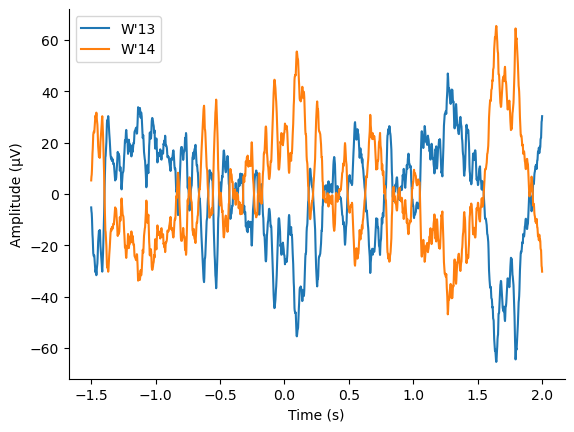

In [181]:
# From the weirdness of thhe above plot
dict_brain_regions_s3['Temporal_Mid L']
test_ch_s3 = epochs_s3.copy().get_data(picks=dict_brain_regions_s3['Temporal_Mid L'])
plt.plot(epochs_s3.times, test_ch_s3[1,0,:]* 1e6, label=dict_brain_regions_s3['Temporal_Mid L'][0])
plt.plot(epochs_s3.times, test_ch_s3[1,1,:] * 1e6, label=dict_brain_regions_s3['Temporal_Mid L'][1])
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.legend()
sns.despine()


In [225]:
# Get coefficients for different trial types (here subj and brain are is changed manually)
area='Lingual L'
sc, coefs_sc = dff.run_temporal_decoder_target_sliding_window(epochs_s3, events_s3, dict_brain_regions_s3[f'{area}'], 1, idx_trial_type_s3['SC'], return_coefs=True)
sc, coefs_ui = dff.run_temporal_decoder_target_sliding_window(epochs_s3, events_s3, dict_brain_regions_s3[f'{area}'], 1, idx_trial_type_s3['UI'], return_coefs=True)


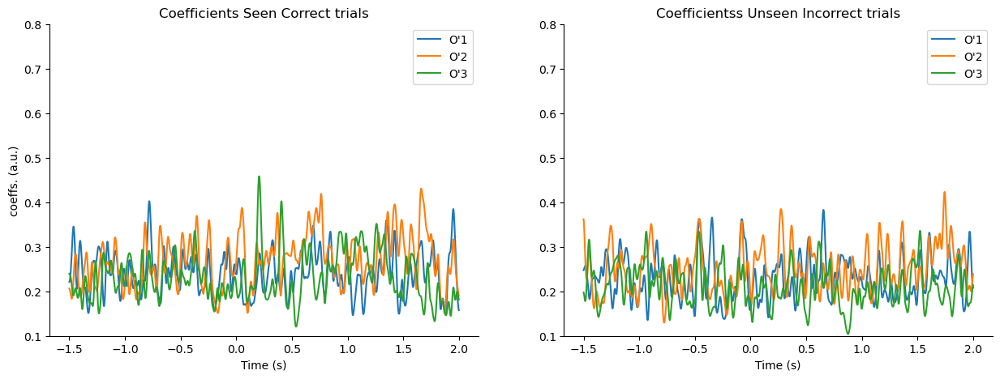

In [226]:
fig, axs = plt.subplots(1,2, figsize=(15,5))

for i in range(len(coefs_sc)):
    axs[0].plot(epochs_s3.times, dff.filter(coefs_sc[i]), label=dict_brain_regions_s3[f'{area}'][i])
    axs[1].plot(epochs_s3.times, dff.filter(coefs_ui[i]), label=dict_brain_regions_s3[f'{area}'][i])

sns.despine()
axs[0].set(title='Coefficients Seen Correct trials', xlabel='Time (s)', ylim=(0.1,0.8), ylabel='coeffs. (a.u.)')
axs[1].set(title='Coefficientss Unseen Incorrect trials', xlabel='Time (s)', ylim=(0.1,0.8))


axs[0].legend()
axs[1].legend()
plt.show()

## Decode from FREQ BANDS

In [6]:
# get epochs dicts separated by frequency bands
epochs_s1_freq_bands = dff.create_dict_freq_bands(epochs_s1)
# epochs_s2_freq_bands = dff.create_dict_freq_bands(epochs_s2)
epochs_s3_freq_bands = dff.create_dict_freq_bands(epochs_s3)
epochs_s4_freq_bands = dff.create_dict_freq_bands(epochs_s4)


In [7]:
# downsample accordingly each freq
all_patients_epochs_freq = [epochs_s1_freq_bands, epochs_s3_freq_bands, epochs_s4_freq_bands]
for epochs_freq in all_patients_epochs_freq:
    for key in epochs_freq.keys(): # get diff resampling based on freq band
        if key == 'Delta':
            epochs_freq[key].resample(sfreq=20)
        elif key == 'Theta':
            epochs_freq[key].resample(sfreq=40)
        elif key == 'Alpha':
            epochs_freq[key].resample(sfreq=60)
        elif key == 'Beta':
            epochs_freq[key].resample(sfreq=100)
        elif key == 'Gamma':
            epochs_freq[key].resample(sfreq=120)
        elif key == 'High gamma':
            epochs_freq[key].resample(sfreq=200)

### Decode Target Location

#### DELTA


In [8]:
epochs_s1_freq_bands['Delta']

Number of events,539
Events,1: 539
Time range,-0.500 – 1.950 s
Baseline,off


In [9]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 1
dict_results_s1_permuted_delta = dff.run_temporal_decoder_all_areas_permutation(epochs_s1_freq_bands['Delta'], events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)

Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


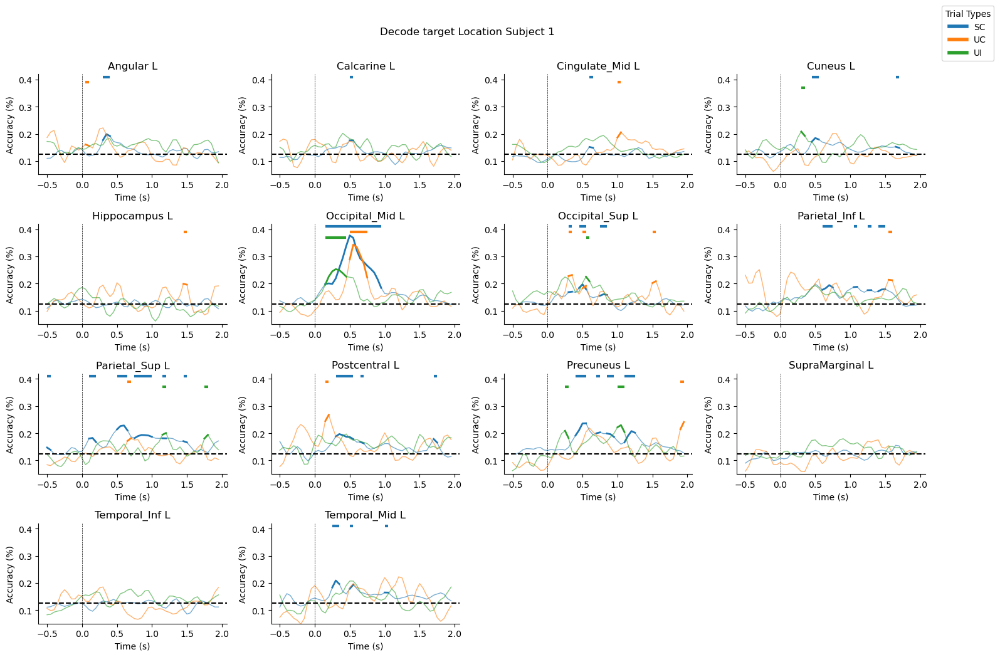

In [11]:
# Plot results S1
# plot_decoding_all_areas(dict_results_s1_delta, dict_brain_regions_s1, epochs_s1.times, ['SC', 'UC', 'UI'], 1)
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_delta, dict_brain_regions_s1, epochs_s1_freq_bands['Delta'].times, ['SC', 'UC', 'UI'], 1)

In [269]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 3
# dict_results_s3_delta = decode_target_location_brain_area(epochs_s3_freq_bands['Delta'], events_s3, dict_brain_regions_s3, idx_trial_type_s3, ['SC', 'UI'], tw=1)
dict_results_s3_permuted_delta = dff.run_temporal_decoder_all_areas_permutation(epochs_s3_freq_bands['Delta'], events_s3, dict_brain_regions_s3, idx_trial_type_s3, ['SC', 'UI'], tw=1, n_permutations=20)


Fusiform L
Lingual L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


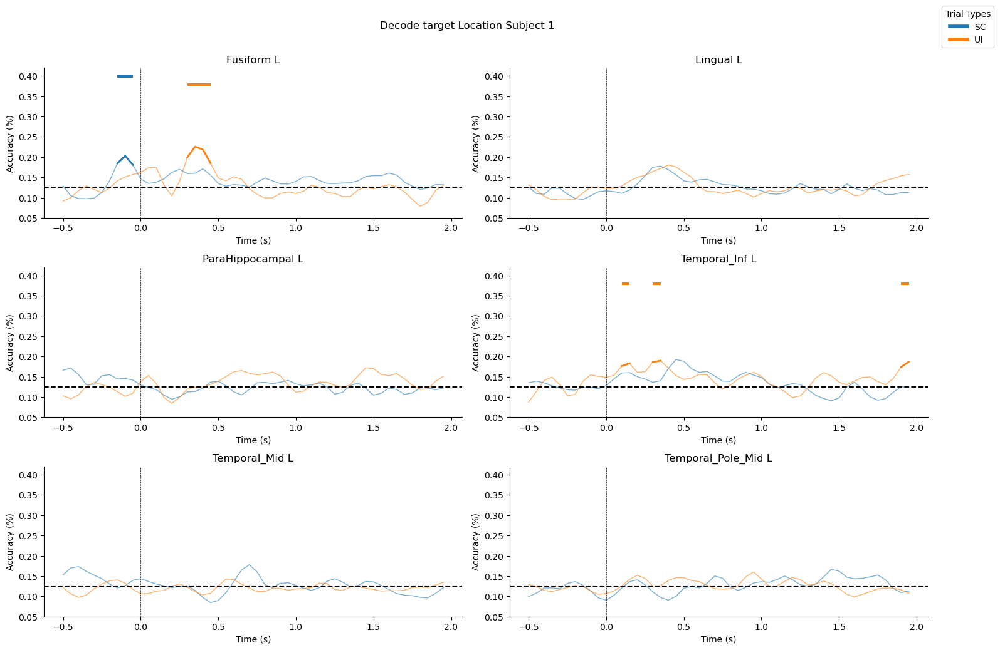

In [270]:
# Plot results S3
# plot_decoding_all_areas(dict_results_s3_delta, dict_brain_regions_s3, epochs_s3.times, ['SC', 'UI'], 3)
dff.plot_decoding_all_areas_w_stats(dict_results_s3_permuted_delta, dict_brain_regions_s3, epochs_s3_freq_bands['Delta'].times, ['SC', 'UI'], 3)



In [271]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 4
# dict_results_s4_delta = decode_target_location_brain_area(epochs_s4_freq_bands['Delta'], events_s4, dict_brain_regions_s4, idx_trial_type_s4, ['SC'], tw=1)  # in UI trials there are not all classes
dict_results_s4_permuted_delta = dff.run_temporal_decoder_all_areas_permutation(epochs_s4_freq_bands['Delta'], events_s4, dict_brain_regions_s4, idx_trial_type_s4, ['SC'], tw=1, n_permutations=20)


Amygdala L
Cerebellum_6 L
Frontal_Mid_2 L
Frontal_Sup_2 L
Fusiform L
Hippocampus L
Insula L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


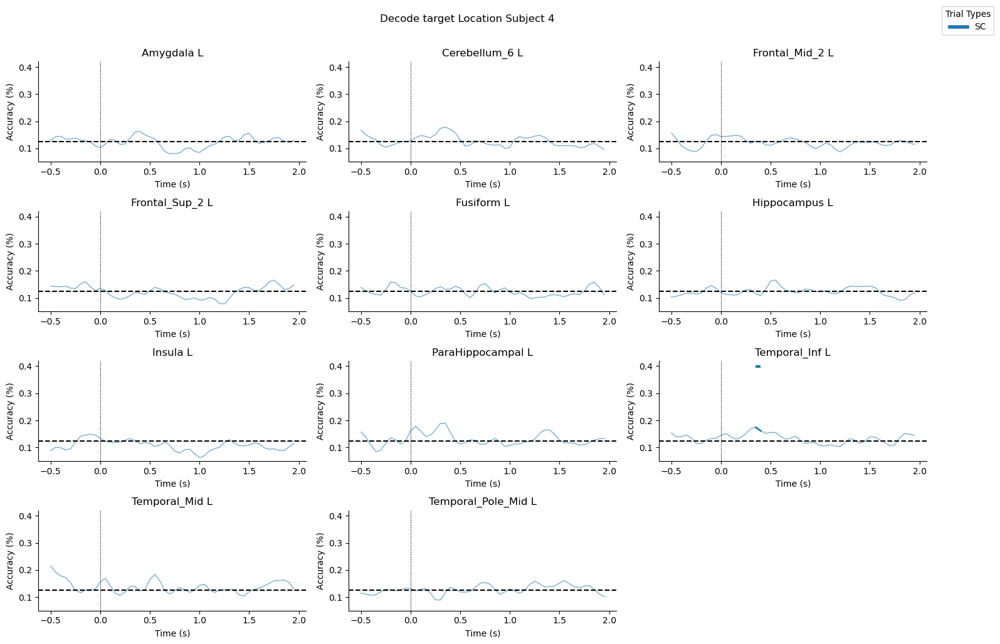

In [272]:
# Plot results S4
# plot_decoding_all_areas(dict_results_s4, dict_brain_regions_s4, epochs_s4.times, ['SC'], 4) # in UI trials there are not all classes
dff.plot_decoding_all_areas_w_stats(dict_results_s4_permuted_delta, dict_brain_regions_s4, epochs_s4_freq_bands['Delta'].times, ['SC'], 4)


#### THETA

In [273]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 1
# dict_results_s1_theta= decode_target_location_brain_area(epochs_s1_freq_bands['Theta'], events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1)
dict_results_s1_permuted_theta = dff.run_temporal_decoder_all_areas_permutation(epochs_s1_freq_bands['Theta'], events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)



Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


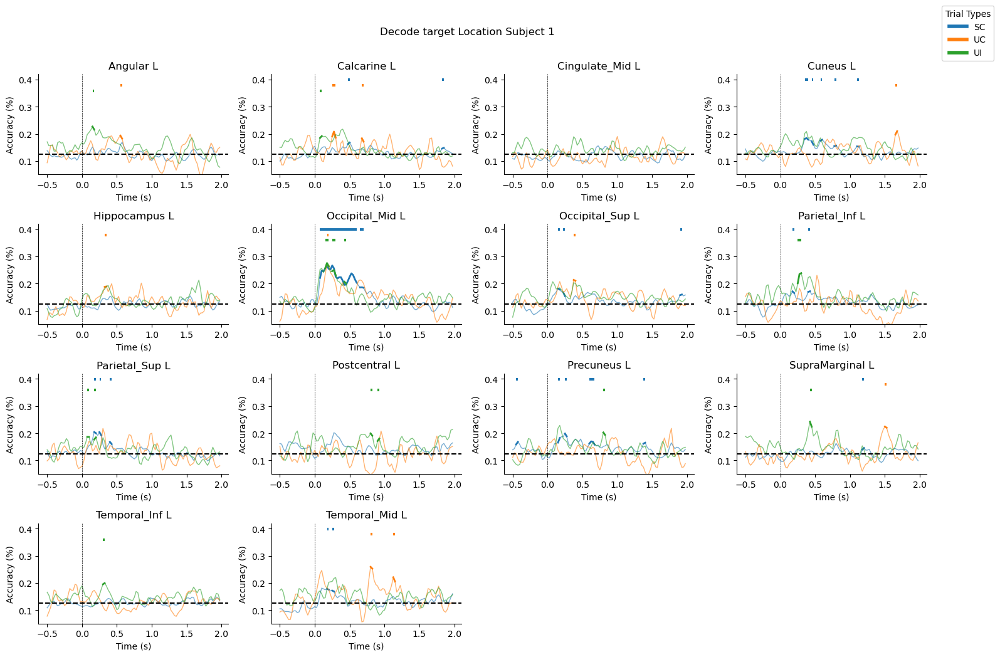

In [274]:
# Plot results S1
# plot_decoding_all_areas(dict_results_s1_theta, dict_brain_regions_s1, epochs_s1.times, ['SC', 'UC', 'UI'], 1)
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_theta, dict_brain_regions_s1, epochs_s1_freq_bands['Theta'].times, ['SC', 'UC', 'UI'], 1)


In [19]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 3
# dict_results_s3_theta = decode_target_location_brain_area(epochs_s3_freq_bands['Theta'], events_s3, dict_brain_regions_s3, idx_trial_type_s3, ['SC', 'UI'], tw=1)
dict_results_s3_permuted_theta = dff.run_temporal_decoder_all_areas_permutation(epochs_s3_freq_bands['Theta'], events_s3, dict_brain_regions_s3, idx_trial_type_s3, ['SC', 'UI'], tw=1, n_permutations=20)



Fusiform L
Lingual L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


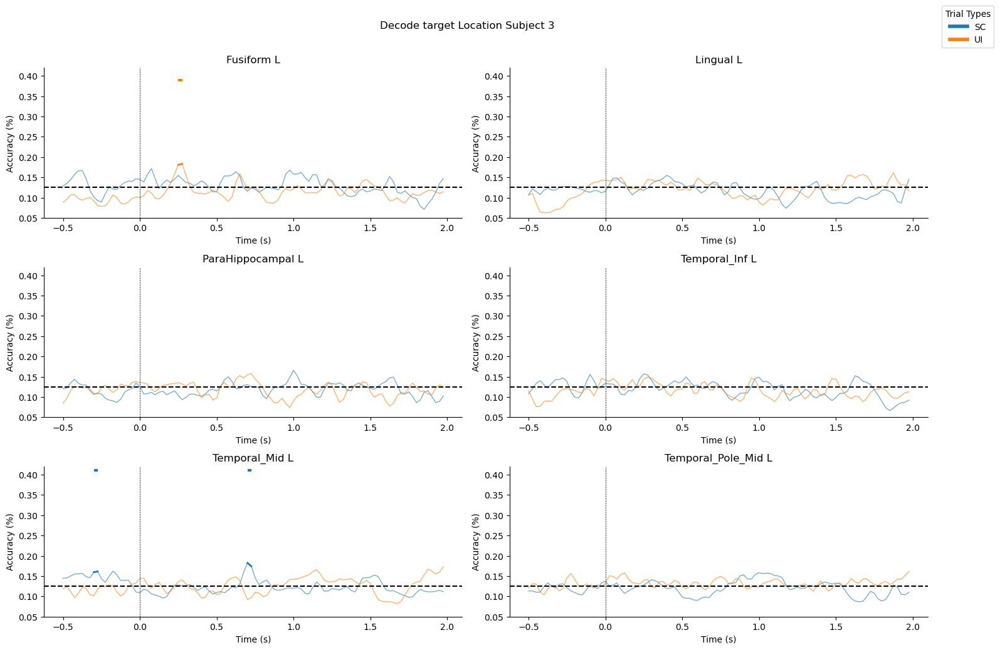

In [20]:
# Plot results S3
# plot_decoding_all_areas(dict_results_s3_delta, dict_brain_regions_s3, epochs_s3.times, ['SC', 'UI'], 3)
dff.plot_decoding_all_areas_w_stats(dict_results_s3_permuted_theta, dict_brain_regions_s3, epochs_s3_freq_bands['Theta'].times, ['SC', 'UI'], 3)



In [16]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 4
# dict_results_s4_theta = dff.decode_target_location_brain_area(epochs_s4_freq_bands['Theta'], events_s4, dict_brain_regions_s4, idx_trial_type_s4, ['SC'], tw=1)  # in UI trials there are not all classes
dict_results_s4_permuted_theta = dff.run_temporal_decoder_all_areas_permutation(epochs_s4_freq_bands['Theta'], events_s4, dict_brain_regions_s4, idx_trial_type_s4, ['SC'], tw=1, n_permutations=20)


Amygdala L
Cerebellum_6 L
Frontal_Mid_2 L
Frontal_Sup_2 L
Fusiform L
Hippocampus L
Insula L
ParaHippocampal L
Temporal_Inf L
Temporal_Mid L
Temporal_Pole_Mid L


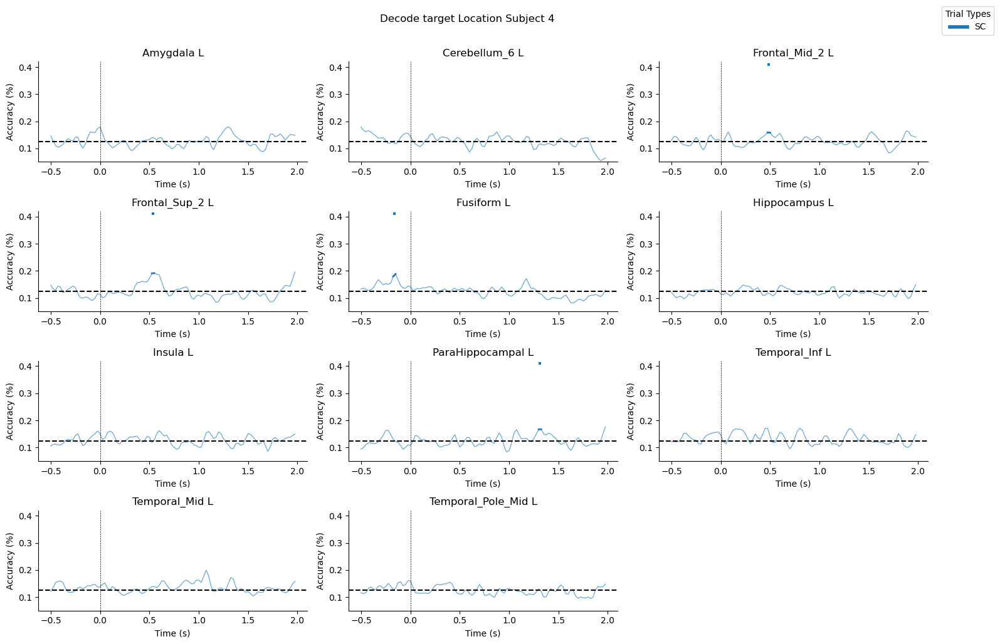

In [21]:
# Plot results S4
dff.plot_decoding_all_areas_w_stats(dict_results_s4_permuted_theta, dict_brain_regions_s4, epochs_s4_freq_bands['Theta'].times, ['SC'], 4) # in UI trials there are not all classes


#### ALPHA

In [22]:

# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 1
dict_results_s1_permuted_alpha = dff.run_temporal_decoder_all_areas_permutation(epochs_s1_freq_bands['Alpha'], events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


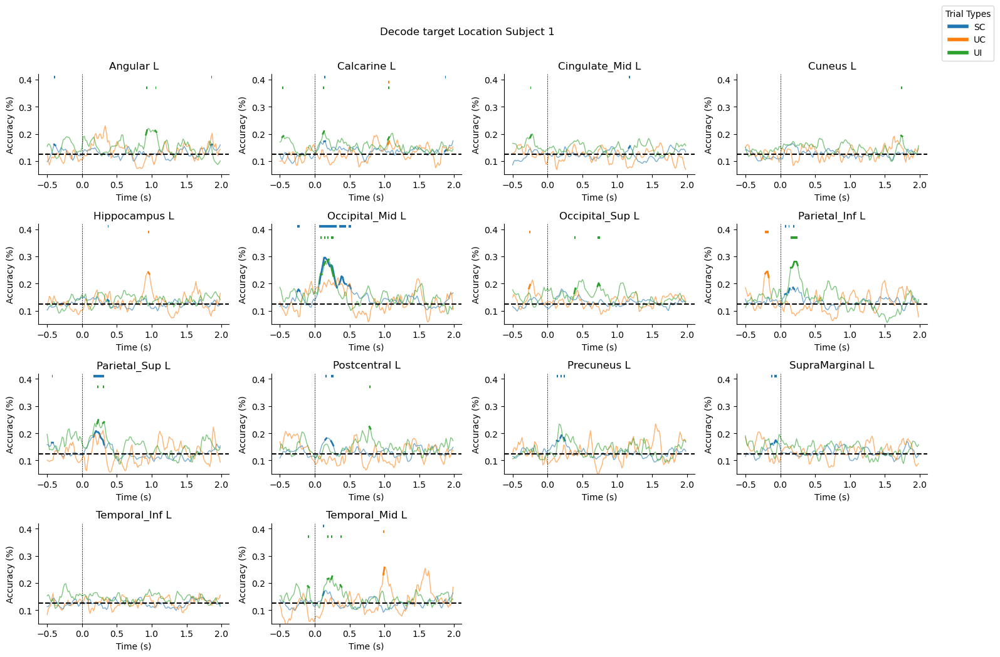

In [23]:
# Plot results S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_alpha, dict_brain_regions_s1, epochs_s1_freq_bands['Alpha'].times, ['SC', 'UC', 'UI'], 1)

### BETA

In [24]:

# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 1
dict_results_s1_permuted_beta= dff.run_temporal_decoder_all_areas_permutation(epochs_s1_freq_bands['Beta'], events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=10)


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


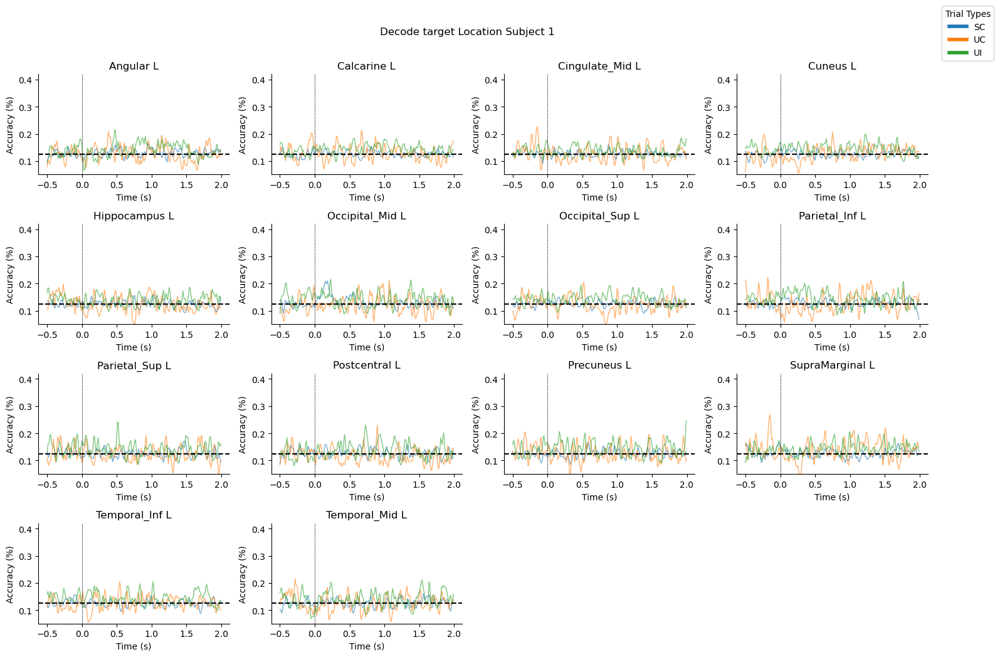

In [25]:
# Plot results S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_beta, dict_brain_regions_s1, epochs_s1_freq_bands['Beta'].times, ['SC', 'UC', 'UI'], 1)

### GAMMA

In [26]:
# DECODE TARGET LOCATION ALL BRAIN REGIONS SUBJECT 1
dict_results_s1_permuted_gamma = dff.run_temporal_decoder_all_areas_permutation(epochs_s1_freq_bands['Gamma'], events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=10)
#(NOTE: DeprecationWarning means that there are not labels for some of the classes)

Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


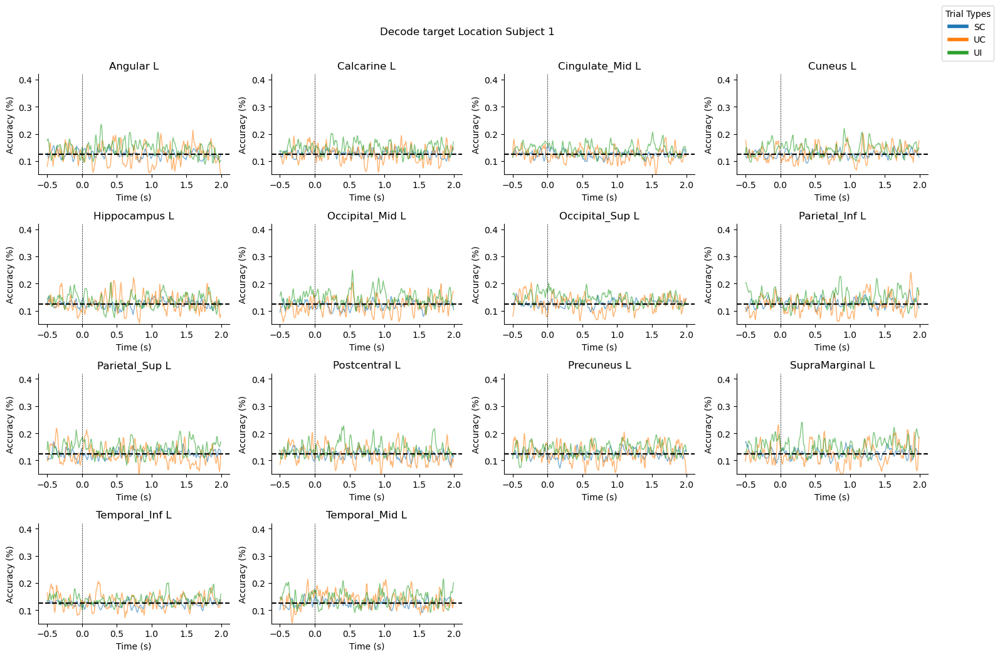

In [28]:
# Plot results S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_gamma, dict_brain_regions_s1, epochs_s1_freq_bands['Gamma'].times, ['SC', 'UC', 'UI'], 1)

### Decode Freq band: amplitude and phase

In [19]:
# hilbert transform the signal

delta_envelope_s1, delta_phase_s1 = dff.get_envelope_phase(epochs_s1_freq_bands['Delta'])
theta_envelope_s1, theta_phase_s1 = dff.get_envelope_phase(epochs_s1_freq_bands['Theta'])
alpha_envelope_s1, alpha_phase_s1 = dff.get_envelope_phase(epochs_s1_freq_bands['Alpha'])
beta_envelope_s1, beta_phase_s1 = dff.get_envelope_phase(epochs_s1_freq_bands['Beta'])
gamma_envelope_s1, gamma_phase_s1 = dff.get_envelope_phase(epochs_s1_freq_bands['Gamma'])

##### DELTA

In [187]:
# DECODE TARGET LOCATION AMPLITUDE AND PHASE
dict_results_s1_permuted_delta_amp = dff.run_temporal_decoder_all_areas_permutation(delta_envelope_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)
# IMPORTANT TO HAVE MIN 20 PERMUTATIONS, OTHERWISE THE PVALS ARE VERY HIGH


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


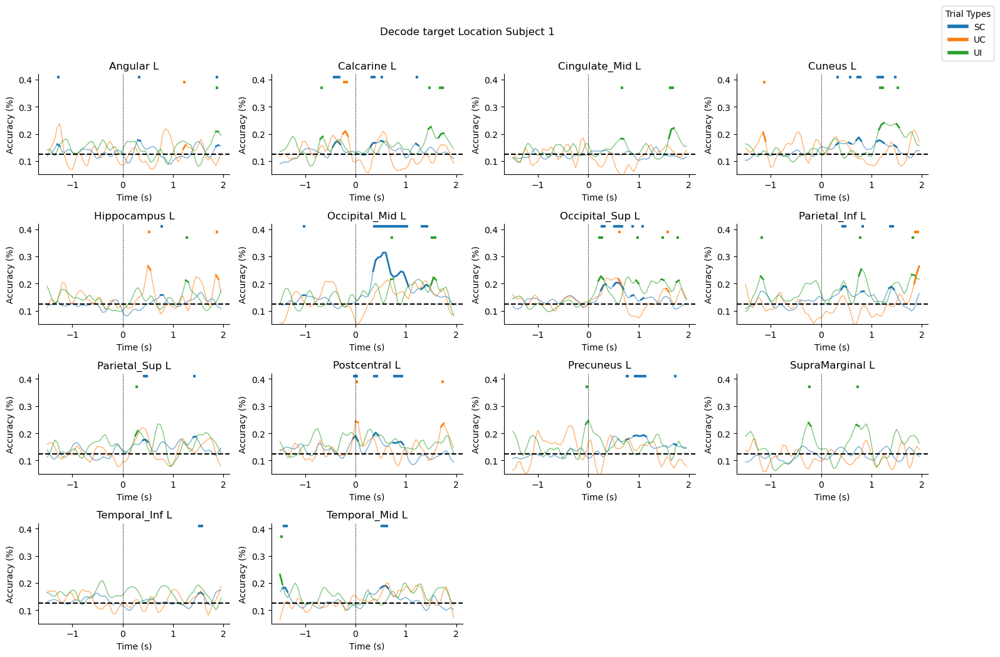

In [188]:
# plot amp delta s1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_delta_amp, dict_brain_regions_s1, epochs_s1_freq_bands['Delta'].times, ['SC', 'UC', 'UI'], 1)


In [15]:
# PHASE S1
dict_results_s1_permuted_delta_phase = dff.run_temporal_decoder_all_areas_permutation(delta_phase_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


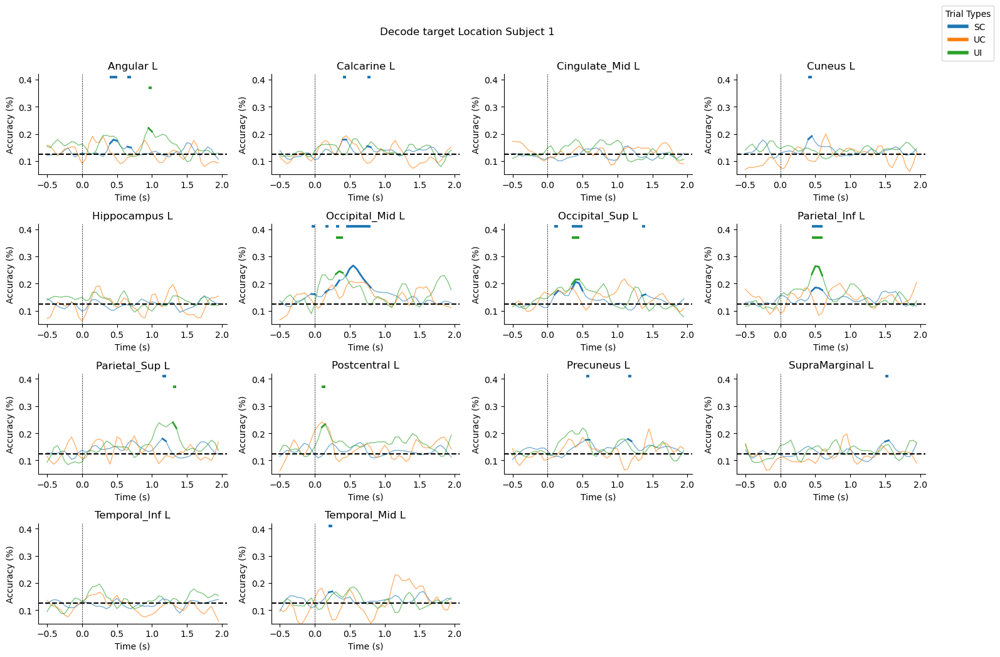

In [16]:
# PLOT PHASE DELTA S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_delta_phase, dict_brain_regions_s1, epochs_s1_freq_bands['Delta'].times, ['SC', 'UC', 'UI'], 1)


##### THETA

In [20]:
# DECODE TARGET LOCATION AMPLITUDE AND PHASE THETA
dict_results_s1_permuted_theta_amp = dff.run_temporal_decoder_all_areas_permutation(theta_envelope_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


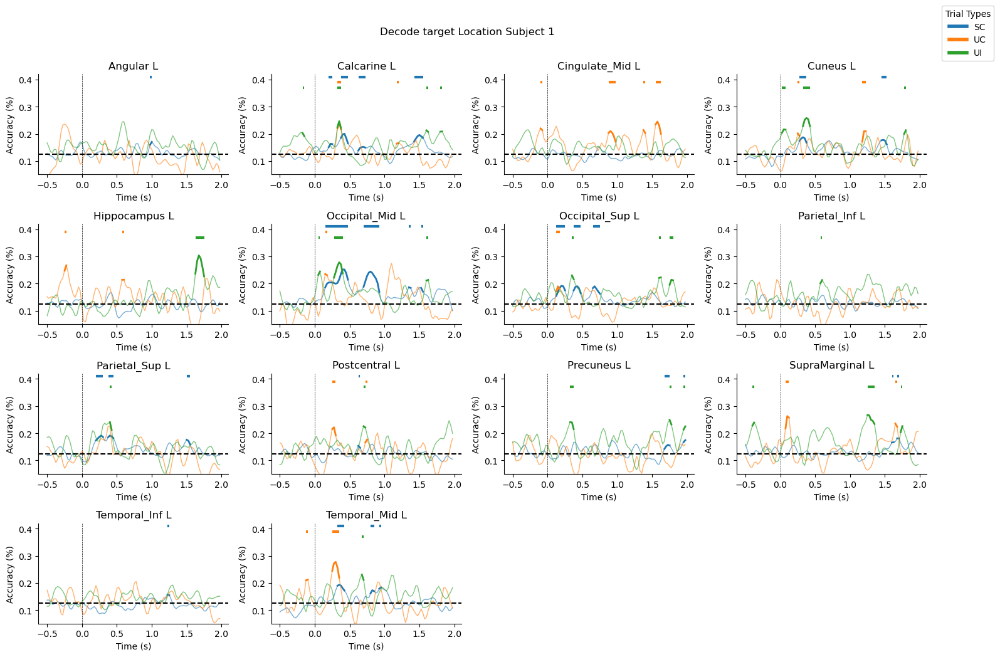

In [21]:
# PLOT ampl theta S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_theta_amp, dict_brain_regions_s1, epochs_s1_freq_bands['Theta'].times, ['SC', 'UC', 'UI'], 1)


In [22]:
# run phase theta S1
# DECODE TARGET LOCATION AMPLITUDE AND PHASE THETA
dict_results_s1_permuted_theta_phase = dff.run_temporal_decoder_all_areas_permutation(theta_phase_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


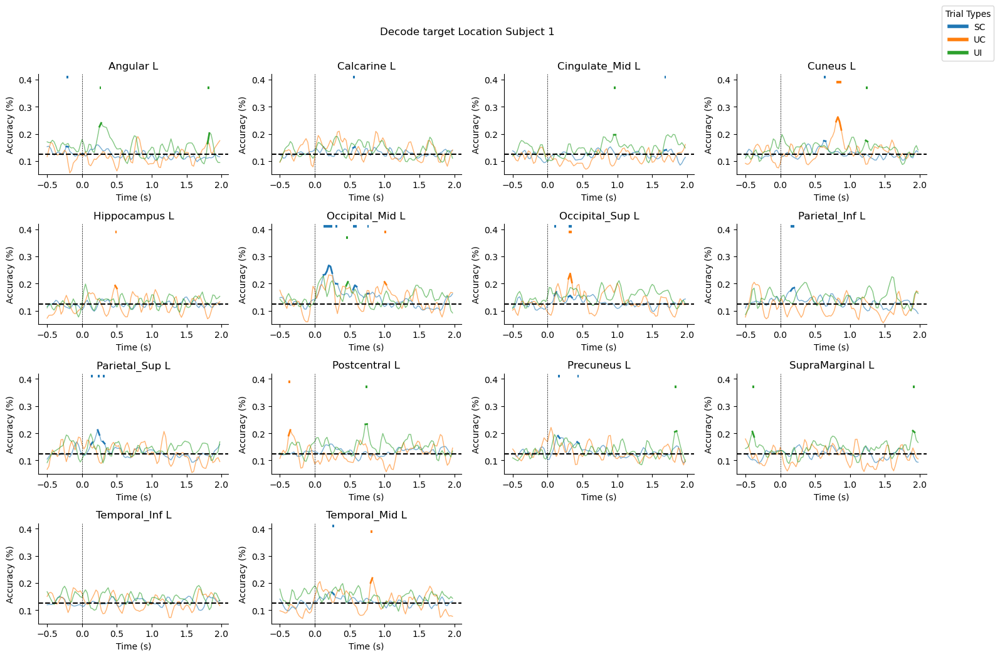

In [23]:
# PLOT phase theta S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_theta_phase, dict_brain_regions_s1, epochs_s1_freq_bands['Theta'].times, ['SC', 'UC', 'UI'], 1)


##### ALPHA

In [24]:
# DECODE TARGET LOCATION AMPLITUDE
dict_results_s1_permuted_alpha_amp = dff.run_temporal_decoder_all_areas_permutation(alpha_envelope_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)
# IMPORTANT TO HAVE MIN 20 PERMUTATIONS, OTHERWISE THE PVALS ARE VERY HIGH


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


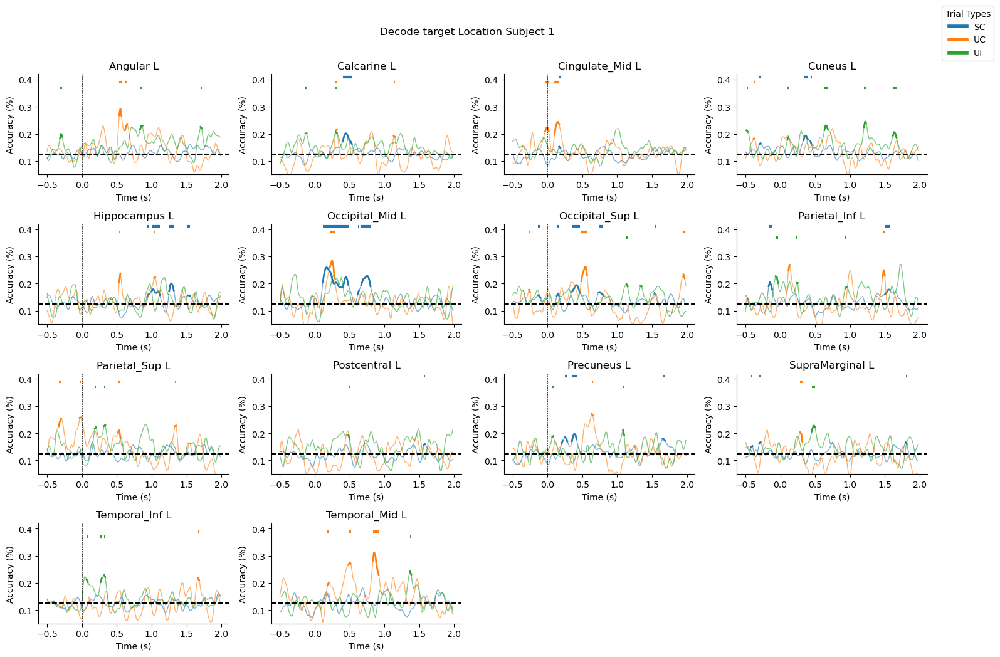

In [27]:
# PLOT phase alpha S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_alpha_amp, dict_brain_regions_s1, epochs_s1_freq_bands['Alpha'].times, ['SC', 'UC', 'UI'], 1)


In [28]:
# DECODE TARGET PHASE
dict_results_s1_permuted_alpha_phase= dff.run_temporal_decoder_all_areas_permutation(alpha_phase_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)
# IMPORTANT TO HAVE MIN 20 PERMUTATIONS, OTHERWISE THE PVALS ARE VERY HIGH


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


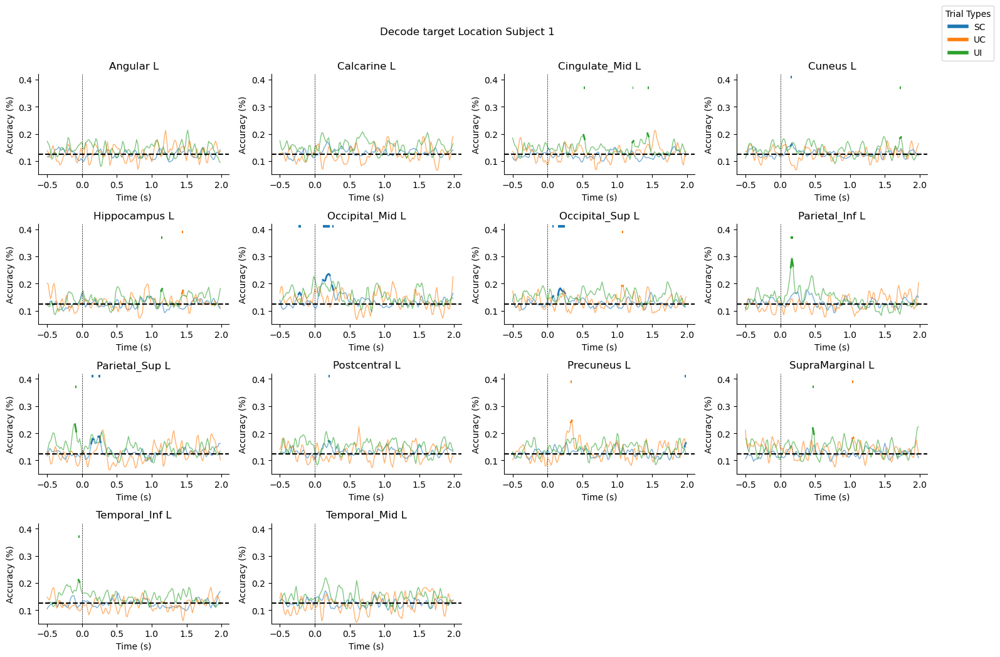

In [29]:
# PLOT phase alpha S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_alpha_phase, dict_brain_regions_s1, epochs_s1_freq_bands['Alpha'].times, ['SC', 'UC', 'UI'], 1)


#### BETA

In [30]:
# DECODE TARGET LOCATION AMPLITUDE
dict_results_s1_permuted_beta_amp = dff.run_temporal_decoder_all_areas_permutation(beta_envelope_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)
# IMPORTANT TO HAVE MIN 20 PERMUTATIONS, OTHERWISE THE PVALS ARE VERY HIGH


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


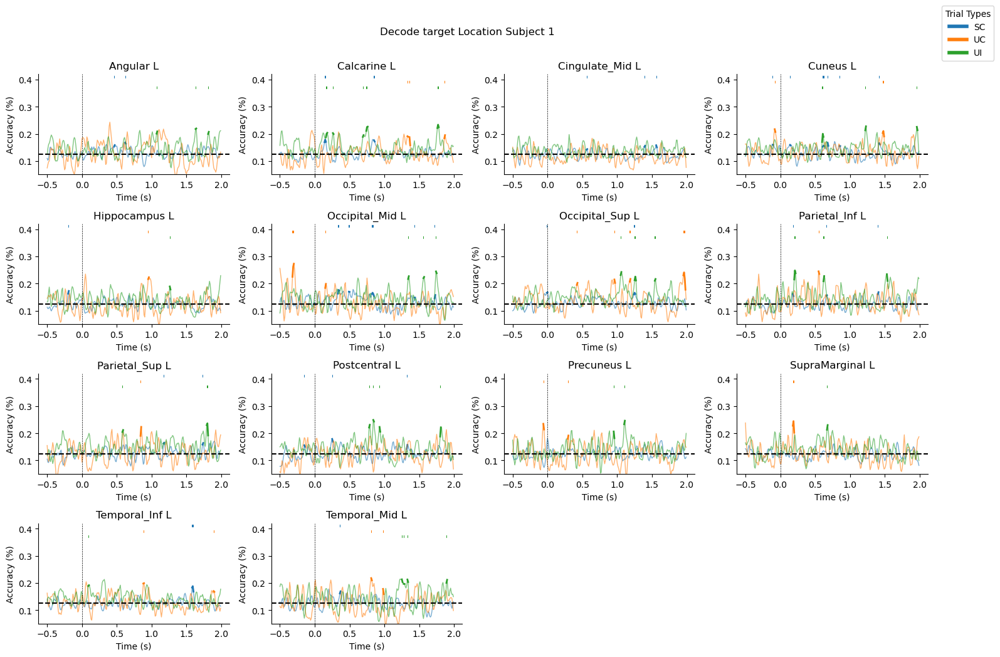

In [31]:
# PLOT amplitude beta S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_beta_amp, dict_brain_regions_s1, epochs_s1_freq_bands['Beta'].times, ['SC', 'UC', 'UI'], 1)


In [32]:
# DECODE TARGET LOCATION PHASE
dict_results_s1_permuted_beta_phase = dff.run_temporal_decoder_all_areas_permutation(beta_phase_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)
# IMPORTANT TO HAVE MIN 20 PERMUTATIONS, OTHERWISE THE PVALS ARE VERY HIGH


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


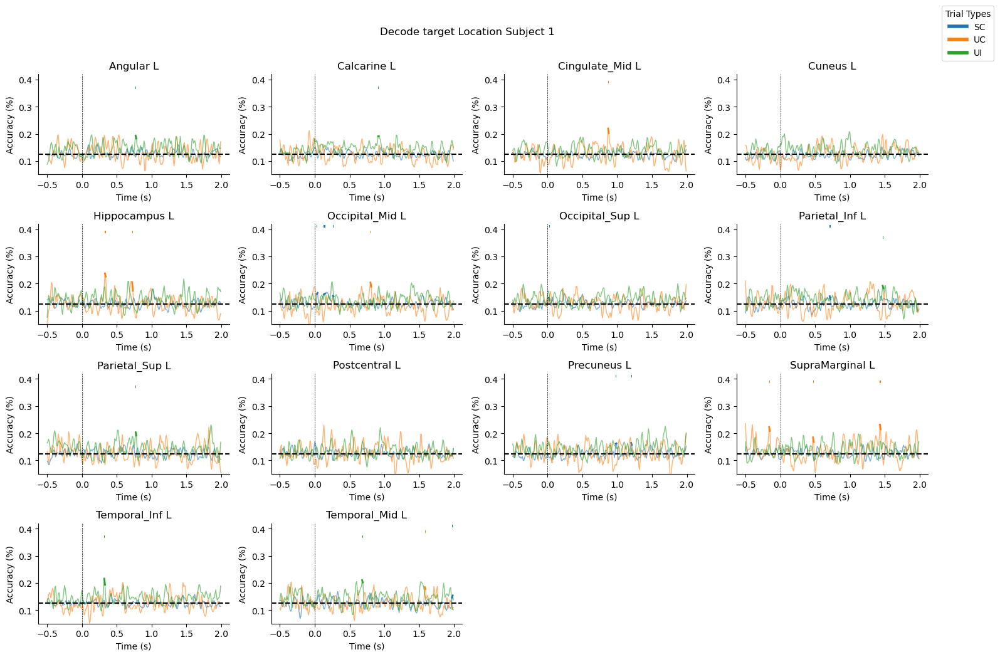

In [33]:
# PLOT phase beta S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_beta_phase, dict_brain_regions_s1, epochs_s1_freq_bands['Beta'].times, ['SC', 'UC', 'UI'], 1)

##### GAMMA

In [34]:
# DECODE TARGET LOCATION AMPLITUDE
dict_results_s1_permuted_gamma_amp = dff.run_temporal_decoder_all_areas_permutation(gamma_envelope_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)
# IMPORTANT TO HAVE MIN 20 PERMUTATIONS, OTHERWISE THE PVALS ARE VERY HIGH


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


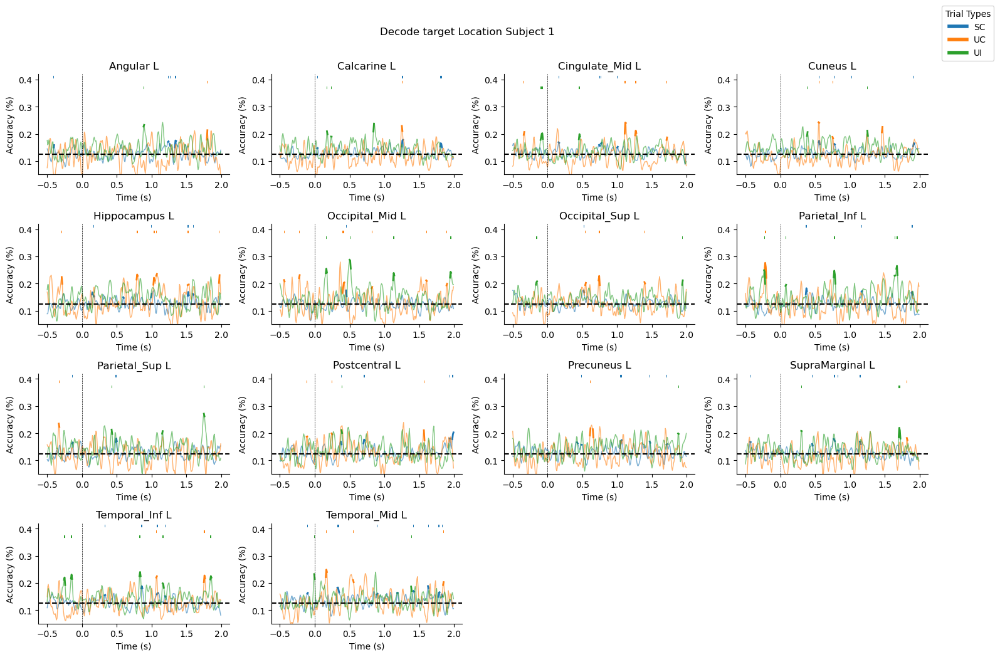

In [35]:
# PLOT amplitude gamma S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_gamma_amp, dict_brain_regions_s1, epochs_s1_freq_bands['Gamma'].times, ['SC', 'UC', 'UI'], 1)


In [36]:
# DECODE TARGET LOCATION PHASE
dict_results_s1_permuted_gamma_phase = dff.run_temporal_decoder_all_areas_permutation(gamma_phase_s1, events_s1, dict_brain_regions_s1, idx_trial_type_s1, ['SC', 'UC', 'UI'], tw=1, n_permutations=20)
# IMPORTANT TO HAVE MIN 20 PERMUTATIONS, OTHERWISE THE PVALS ARE VERY HIGH


Angular L
Calcarine L
Cingulate_Mid L
Cuneus L
Hippocampus L
Occipital_Mid L
Occipital_Sup L
Parietal_Inf L
Parietal_Sup L
Postcentral L
Precuneus L
SupraMarginal L
Temporal_Inf L
Temporal_Mid L


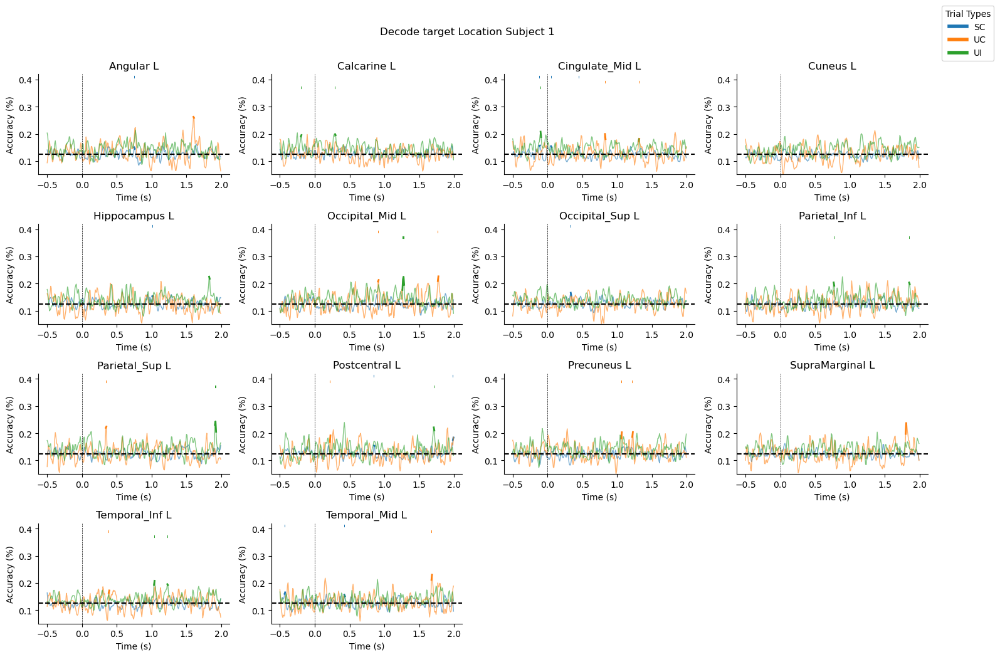

In [37]:
# PLOT phase gamma S1
dff.plot_decoding_all_areas_w_stats(dict_results_s1_permuted_gamma_phase, dict_brain_regions_s1, epochs_s1_freq_bands['Gamma'].times, ['SC', 'UC', 'UI'], 1)

### Decode Trial Type

#### DELTA

In [401]:
# DECODE TRIAL TYPE ALL BRAIN REGIONS SUBJECT 1
dict_results_tt_s1_delta = dff.decode_trial_type_brain_area(epochs_s1_freq_bands['Delta'], events_s1, dict_brain_regions_s1, tw=1)


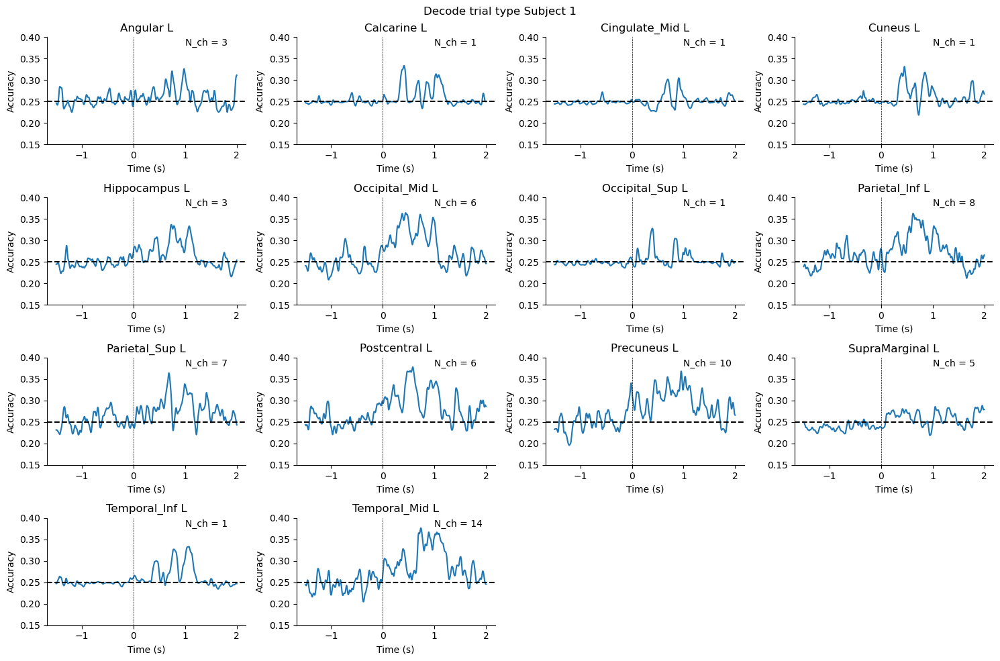

In [403]:
# Plot results S1
dff.plot_decoding_tt_all_areas(dict_results_tt_s1_delta, dict_brain_regions_s1, epochs_s1.times, 1)


In [ ]:
# skip subj 2 for now

In [404]:
# DECODE TRIAL TYPE ALL BRAIN REGIONS SUBJECT 3
dict_results_tt_s3_delta = dff.decode_trial_type_brain_area(epochs_s3_freq_bands['Delta'], events_s3, dict_brain_regions_s3, tw=1)


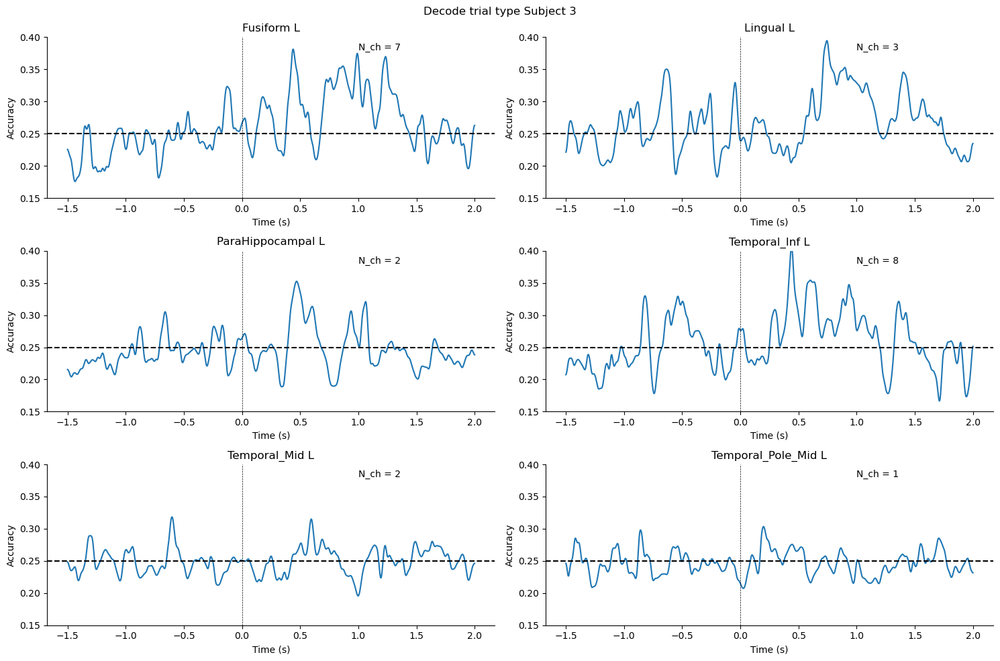

In [454]:
# Plot results S3
dff.plot_decoding_tt_all_areas(dict_results_tt_s3_delta, dict_brain_regions_s3, epochs_s3.times, 3)


In [451]:
# DECODE TRIAL TYPE ALL BRAIN REGIONS SUBJECT 4
dict_results_tt_s4_delta = dff.decode_trial_type_brain_area(epochs_s4_freq_bands['Delta'], events_s4, dict_brain_regions_s4, tw=1)


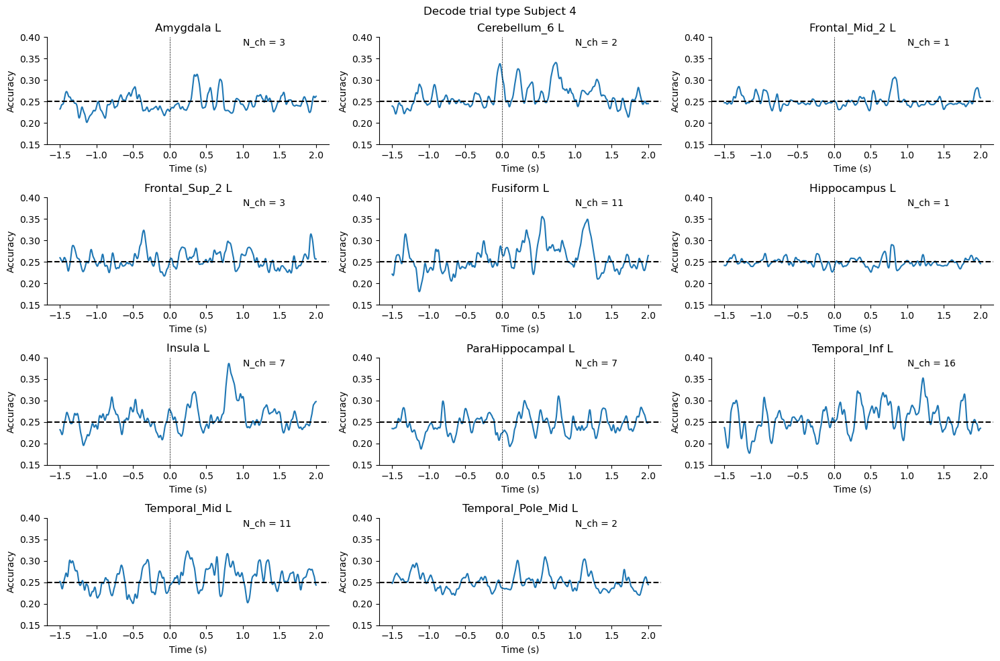

In [455]:
# Plot results S4
dff.plot_decoding_tt_all_areas(dict_results_tt_s4_delta, dict_brain_regions_s4, epochs_s4.times, 4)


#### THETA

In [456]:
# DECODE TRIAL TYPE ALL BRAIN REGIONS SUBJECT 1
dict_results_tt_s1_theta = dff.decode_trial_type_brain_area(epochs_s1_freq_bands['Theta'], events_s1, dict_brain_regions_s1, tw=1)


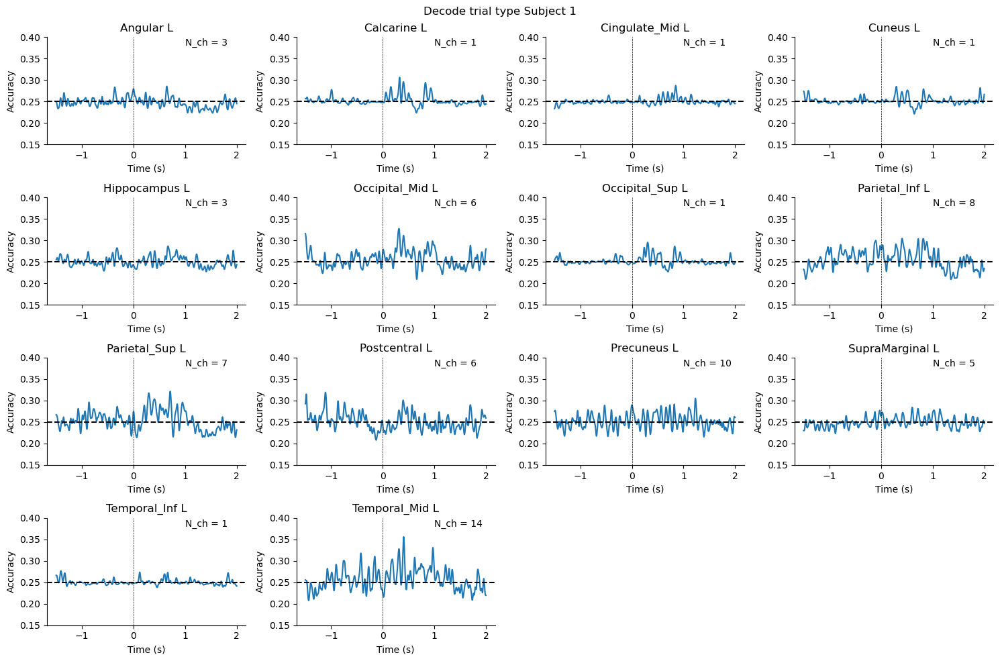

In [458]:
# Plot results S1
dff.plot_decoding_tt_all_areas(dict_results_tt_s1_theta, dict_brain_regions_s1, epochs_s1.times, 1)


## Decode from power spectrum


In [107]:
# Downsample the data to a frequency range of interest (1-100Hz)
epochs_s1_downsampled = epochs_s1.copy().resample(sfreq=200)
# epochs_s3_downsampled = epochs_s3.copy().resample(sfreq=200)
# epochs_s4_downsampled = epochs_s4.copy().resample(sfreq=200)

In [10]:
# epochs_s1_downsampled.info

<Info | 9 non-empty values
 bads: []
 ch_names: R'11, R'12, S'1, S'3, S'4, S'5, S'6, S'7, S'8, P'1, P'2, P'3, ...
 chs: 69 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.5 Hz
 lowpass: 100.0 Hz
 meas_date: 2016-05-26 16:37:40 UTC
 meas_id: 4 items (dict)
 nchan: 69
 projs: []
 sfreq: 200.0 Hz
>

In [109]:

from mne.time_frequency import tfr_morlet

# Define frequency ranges and wavelet parameters
freqs_1_29_hz = np.arange(1, 30, 2)  # 1 to 29 Hz in 2-Hz steps
freqs_30_100_hz = np.arange(30, 101, 5)  # 30 to 100 Hz in 5-Hz steps

# Combine frequencies
freqs = np.concatenate((freqs_1_29_hz, freqs_30_100_hz))

# Morlet wavelet parameters
n_cycles = freqs / 2  # More cycles for higher frequencies, to balance frequency and time precision

# Calculate power using Morlet wavelet transform for each trial
power = tfr_morlet(epochs_s1_downsampled, freqs=freqs, n_cycles=n_cycles, return_itc=False, average=False)

# Reference period for Z-scoring: -2 s to +2 s relative to stimulus onset (though i set it  to -500ms to 1.5s)
reference_times = (epochs_s1_downsampled.tmin, epochs_s1_downsampled.tmax)  # In seconds

# Get the indices corresponding to the reference period in time
reference_mask = (epochs_s1_downsampled.times >= reference_times[0]) & (epochs_s1_downsampled.times <= reference_times[1])

# Z-score the power within each trial
power_data = power.data  # Shape: (n_trials, n_channels, n_frequencies, n_times)
n_trials, n_channels, n_freqs, n_times = power_data.shape

zscored_power = np.zeros_like(power_data)

for trial in range(n_trials):
    for ch in range(n_channels):
        for f in range(n_freqs):
            # Extract the power for the reference period
            reference_power = power_data[trial, ch, f, reference_mask]
            # Mean and standard deviation of the reference power
            ref_mean = np.mean(reference_power)
            ref_std = np.std(reference_power)
            # Z-score the power time series
            zscored_power[trial, ch, f, :] = (power_data[trial, ch, f, :] - ref_mean) / ref_std

# `zscored_power` now contains the Z-scored power time series for each trial
# Shape: (n_trials, n_channels, n_frequencies, n_times)


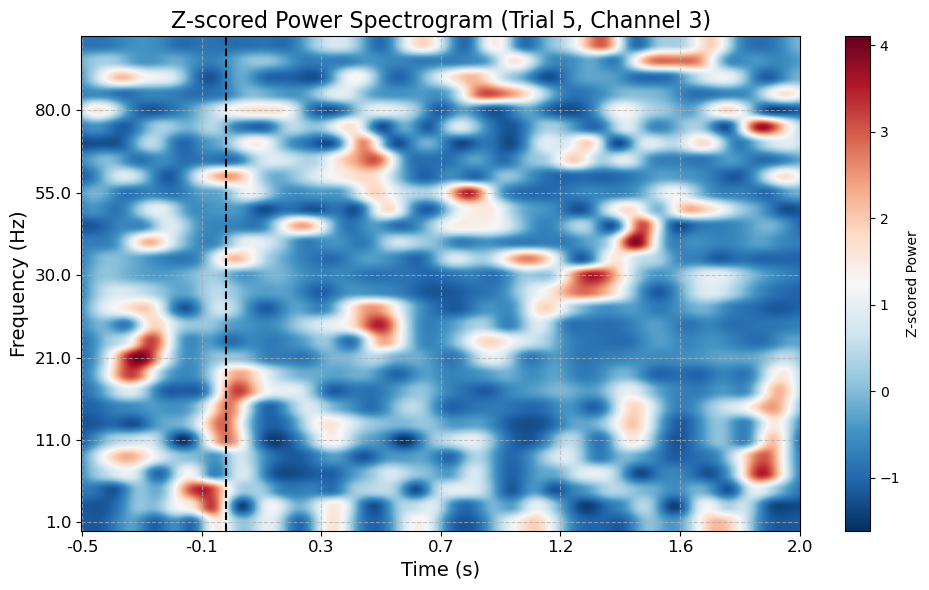

In [208]:
# Random example of the time-frequency plot.

# Parameters for plotting
trial_idx = 5  # Second trial (index 1)
channel_idx = 3  # Fourth channel (index 3)

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the z-scored power without using extent for y-axis, instead let imshow handle it
im = ax.imshow(zscored_power[trial_idx, channel_idx, :, :],
               aspect='auto',  # Ensure aspect ratio is correct
               origin='lower',  # Ensure lower frequencies are at the bottom
               cmap='RdBu_r')  # Divergent colormap for z-scores

cbar = plt.colorbar(im, ax=ax)
cbar.set_label('Z-scored Power')

# Set the correct frequency labels
y_ticks = np.arange(len(freqs))  # Tick positions in the y-axis
y_labels = [f'{f:.1f}' for f in freqs]  # Convert freqs to string for labeling

# Set the correct time labels using the epochs times
x_ticks = np.linspace(0, zscored_power.shape[-1] - 1, num=7)  # 7 evenly spaced time points
x_labels = [f'{t:.1f}' for t in np.linspace(epochs_s1_downsampled.times[0], epochs_s1_downsampled.times[-1], num=7)]

# Apply the labels
ax.set_yticks(y_ticks[::5])  # Show every 5th frequency to avoid cluttering
ax.set_yticklabels(y_labels[::5], fontsize=12)
ax.set_xticks(x_ticks)
ax.set_xticklabels(x_labels, fontsize=12)

# Add labels and title
ax.set_title(f'Z-scored Power Spectrogram (Trial {trial_idx}, Channel {channel_idx})', fontsize=16)
ax.set_xlabel('Time (s)', fontsize=14)
ax.set_ylabel('Frequency (Hz)', fontsize=14)

# Add gridlines for better visual separation
ax.grid(True, linestyle='--', alpha=0.7)
ax.axvline(np.where(epochs_s1_downsampled.times == 0)[0], c='k', ls='--')

# Show the plot
plt.tight_layout()
plt.show()


In [265]:
dict_results_all_areas_power_decoder = {}

for key in dict_brain_regions_s1.keys():

    dict_power_results_1area = {}
    trial_types = ['SC', 'UC', 'UI']

    for tt in trial_types:
        all_scores_1tt = []
        for ch in dict_brain_regions_s1[key]:
            scores = dff.run_temporal_decoder_target_sliding_window_powwer_timeseries(epochs_s1_downsampled, zscored_power, events_s1, ch, idx_trial_type_s1[tt])
            all_scores_1tt.append(scores)
        
        dict_power_results_1area[tt] = all_scores_1tt
    
    
    dict_results_all_areas_power_decoder[key] = dict_power_results_1area


In [266]:
dict_results_all_areas_power_decoder.keys()

dict_keys(['Angular L', 'Calcarine L', 'Cingulate_Mid L', 'Cuneus L', 'Hippocampus L', 'Occipital_Mid L', 'Occipital_Sup L', 'Parietal_Inf L', 'Parietal_Sup L', 'Postcentral L', 'Precuneus L', 'SupraMarginal L', 'Temporal_Inf L', 'Temporal_Mid L'])

/var/folders/dz/h7fplw7j4_51jm5flk8vrbfr0000gn/T/ipykernel_4249/3571124089.py:47: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


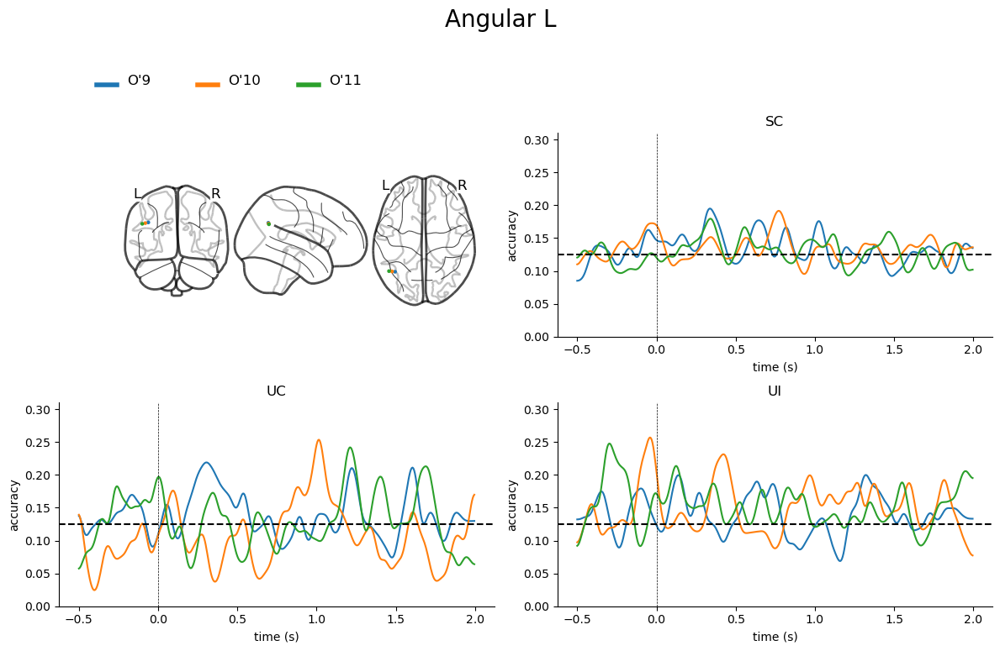

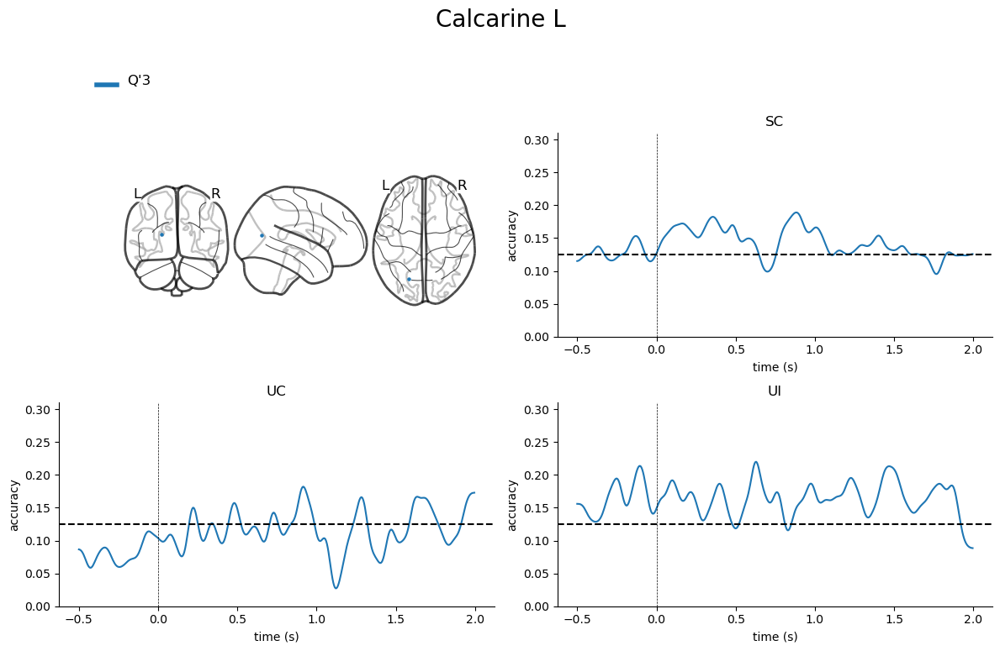

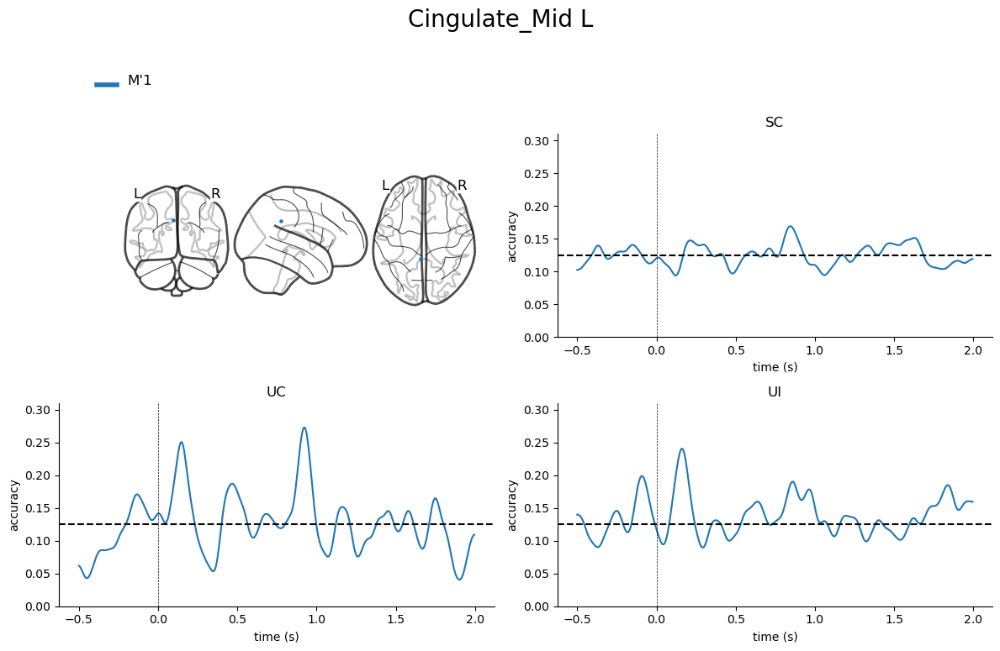

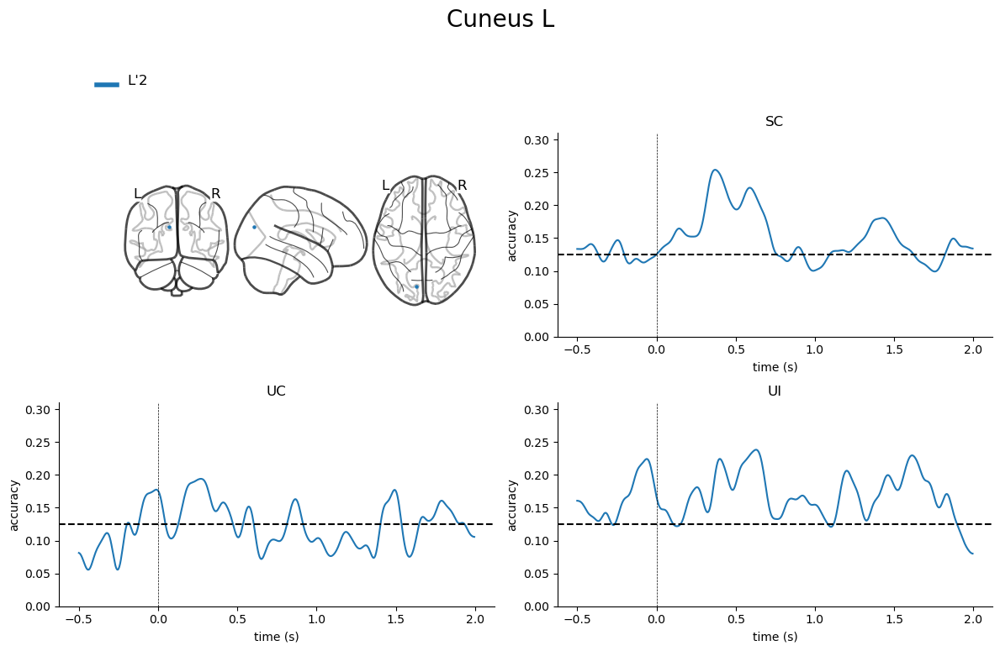

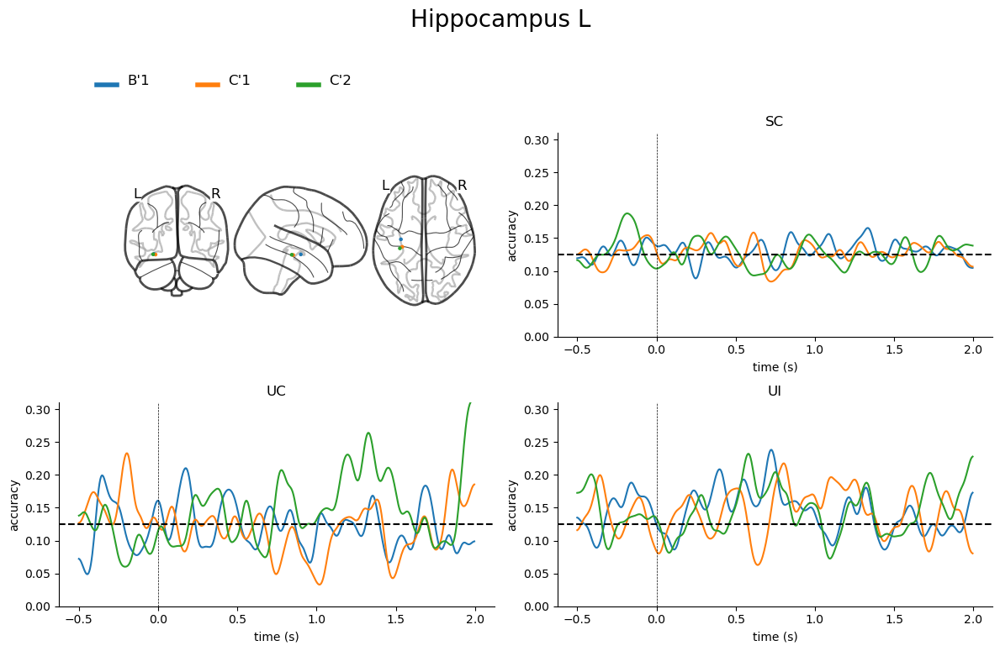

...

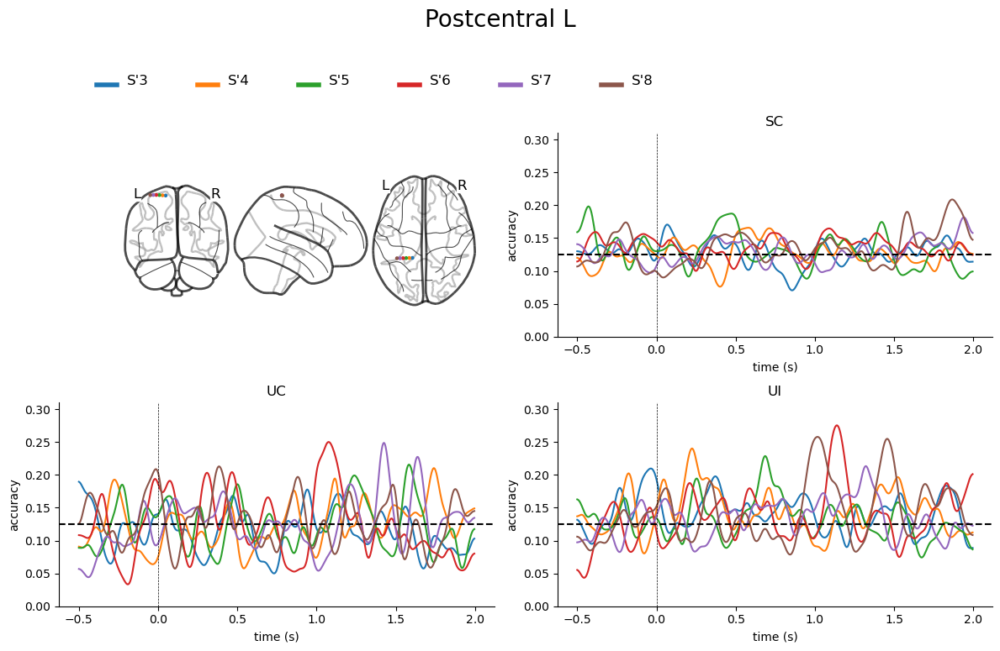

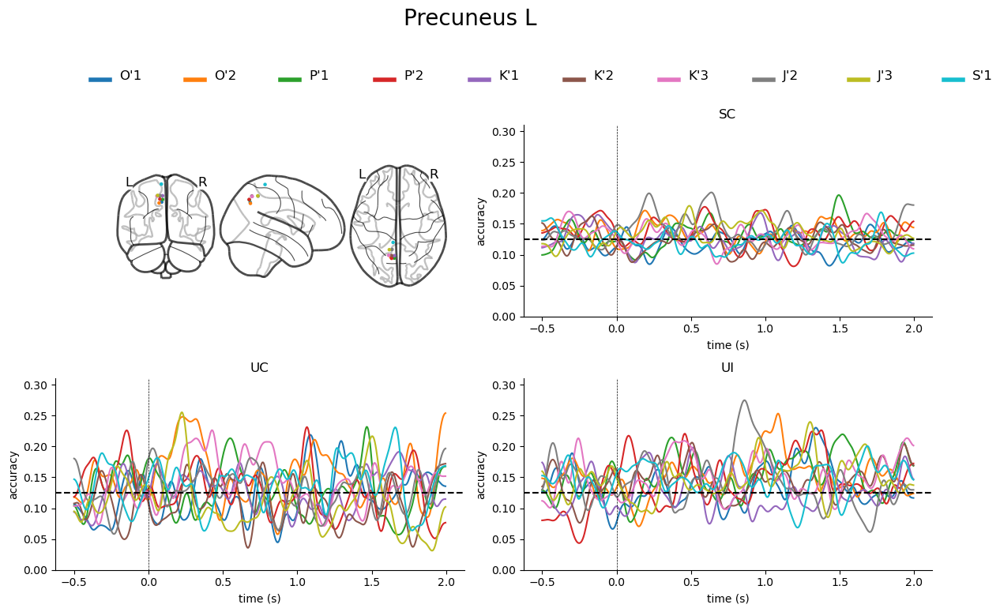

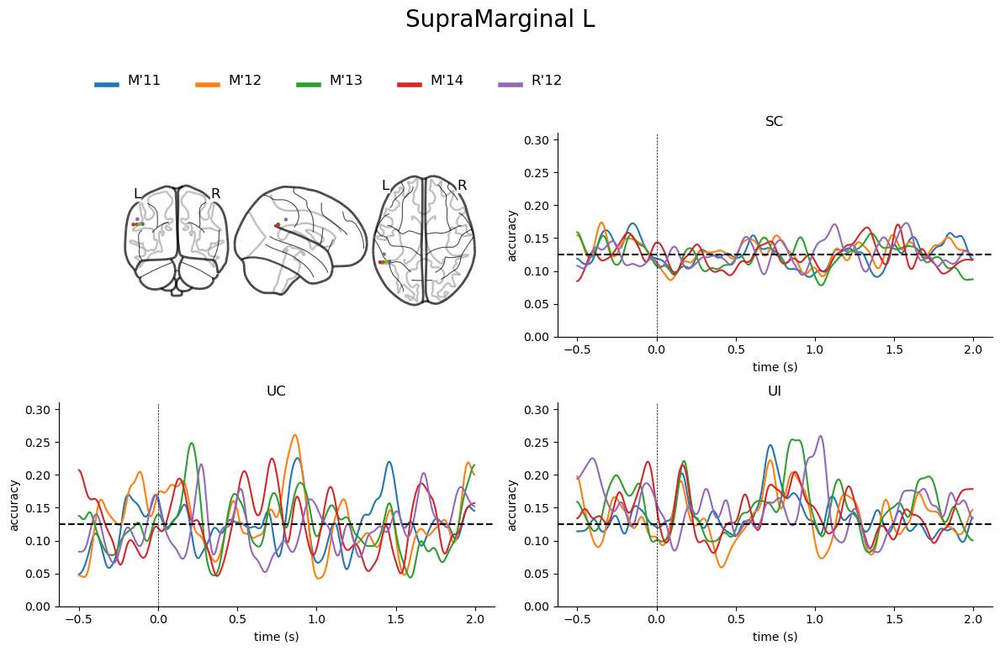

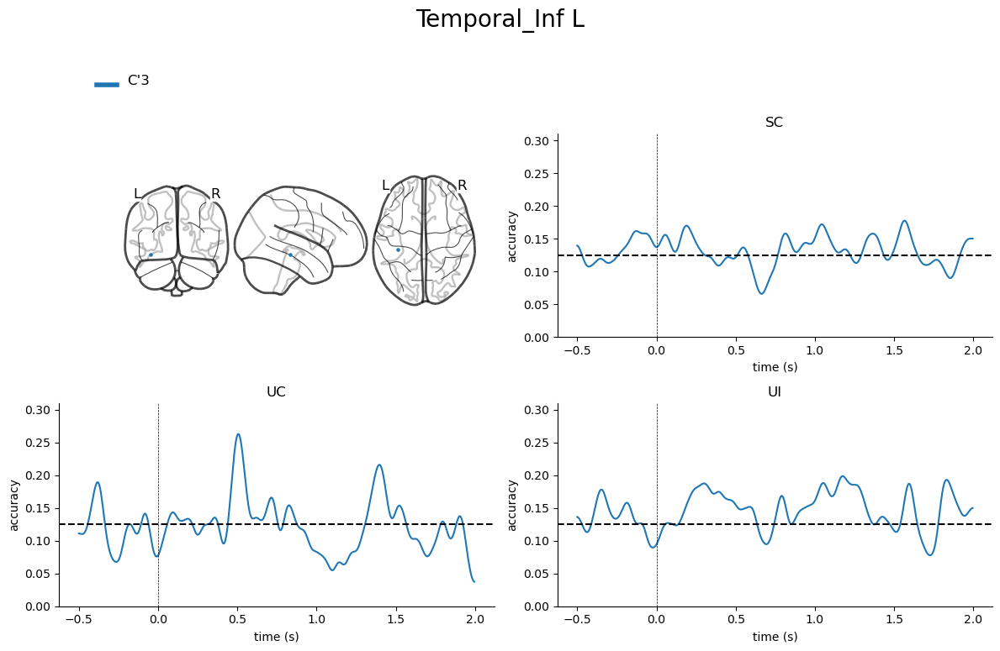

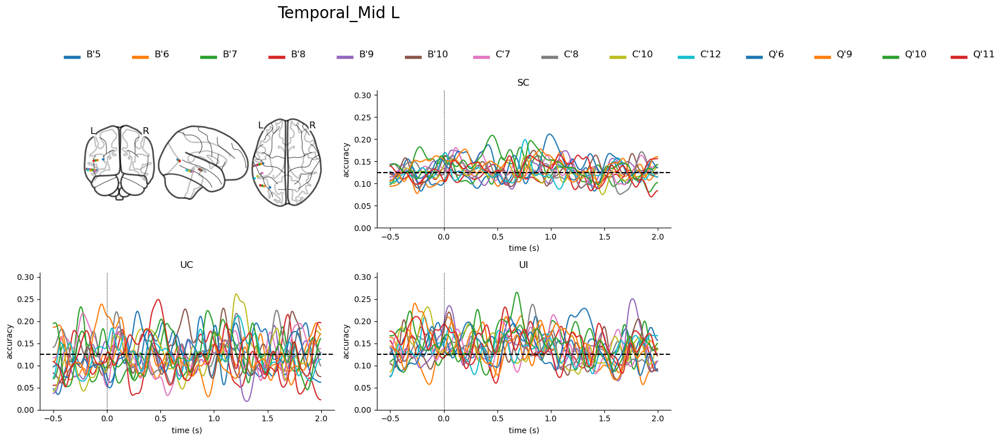

In [269]:
# plot results

for kk in dict_results_all_areas_power_decoder.keys():
    dff.plot_power_timeseries_decoder(dict_results_all_areas_power_decoder[kk], kk ,probes_s1, dict_brain_regions_s1[kk])